In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import networkx as nx
import os

In [24]:
def row_norm0(ls_vec):
    #res = ls_vec / sum(ls_vec)
    #res = ls_vec**0.5 / sum(ls_vec**0.5)
    res = ls_vec
    return res

def row_norm(lss):
    tmp = np.zeros(lss.shape)
    for i in range(lss.shape[0]):
        tmp[i] = row_norm0(lss[i])
    return tmp

def get_thresh(lss, sparsity=0.1):
    tmp = row_norm(lss)
    tmp_srt = np.sort(tmp.reshape(-1))[::-1]
    idx = int(lss.shape[0]*lss.shape[1]*sparsity)+1
    th = tmp_srt[idx]
    return th

def ext_rel(ls_vec, th):
    norm_ls = row_norm0(ls_vec)
    #print(norm_ls)
    res = np.where(norm_ls > th)
    return res[0]

def print_connect(lss, th=0.6):
    for j in range(nodes):
        i = ext_rel(lss[j], th)
        print(str(i) + ' -> ' + str(j))

def draw_graph(edges, gtG, npos, lpos, save=None, t=None):
    plt.figure() 
    right_edge =  [e for e in gtG.edges() if e in edges]
    add_edge = [e for e in edges if e not in gtG.edges()]
    del_edge = [e for e in gtG.edges() if e not in edges]
    
    nx.draw_networkx_edges(gtG, npos, edgelist=right_edge, alpha=1.0, weight=1.5, edge_color='g')
    nx.draw_networkx_edges(gtG, npos, edgelist=add_edge, alpha=0.3, edge_color='y', style='dashed')
    nx.draw_networkx_edges(gtG, npos, edgelist=del_edge, alpha=0.3, edge_color='r', style='dotted')
    nx.draw_networkx_nodes(gtG, npos, node_color='b',alpha=1.0)
    nx.draw_networkx_labels(gtG,pos=lpos)
    plt.xlabel('Basis network')
    
    fig = plt.figure() 
    right_edge =  [e for e in gtG.edges() if e in edges]
    add_edge = [e for e in edges if e not in gtG.edges()]
    del_edge = [e for e in gtG.edges() if e not in edges]
    #print(right_edge)
    nx.draw_networkx_edges(gtG, npos, edgelist=right_edge, alpha=1.0, weight=1.5, edge_color='g')
    #nx.draw_networkx_edges(gtG, npos, edgelist=add_edge, alpha=1.0, edge_color='y', style='dashed')
    nx.draw_networkx_edges(gtG, npos, edgelist=del_edge, alpha=0.1, edge_color='r', style='dotted')
    nx.draw_networkx_nodes(gtG, npos, node_color='b',alpha=1.0)
    nx.draw_networkx_labels(gtG,pos=lpos)
    if t:
        plt.xlabel('t = %03d' % t)
    else:
        plt.xlabel('Basis network')
    plt.show()
    if save:
        plt.savefig(save)
    plt.close(fig)

In [3]:
nodes=10
mf_fname = '/home/linaiqi/Lab/data/gene/mf10gene.txt'
mf_res_fname = '/home/linaiqi/Lab/data/gene/res/mf10gene/gpgene_mf10net_n500_m40.txt'

basis_e = 20

In [4]:
with open(mf_fname) as f:
    gene_name = f.readline().strip().split()

gtG = nx.DiGraph()
for j in range(nodes):
    gtG.add_node(gene_name[j])
    
edge_list = [('dgsA','malT'), ('lrp','malT'), ('lrp','yeiL'), ('lrp','csiD'), ('lrp','stpA'),
             ('gadE','lrp'), ('csiR','csiD'), ('evgA','gadE'), ('ydeO','gadE'), ('evgA','ydeO')]
for (v1,v2) in edge_list:
    gtG.add_edge(v1, v2)

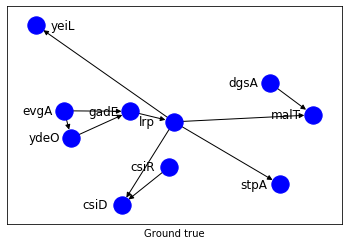

In [19]:
npos=nx.spring_layout(gtG, scale=1, k=0.7, seed=0)
lpos=nx.spring_layout(gtG, scale=1, k=0.7, seed=0)
for k in lpos.keys():
    lpos[k][0] -= 0.15
lpos['yeiL'][0]+=0.3

# plt.figure(figsize=(8,6))
nx.draw_networkx_edges(gtG, npos, alpha=1.0)
nx.draw_networkx_nodes(gtG, npos, node_color='b',alpha=1.0)
nx.draw_networkx_labels(gtG,pos=lpos)
plt.xlabel('Ground true')
plt.show()

In [6]:
mf_e = []

with open(mf_res_fname) as f:
    for l in f:
        n1, n2, v = l.strip().split()
        mf_e.append((n1, n2))

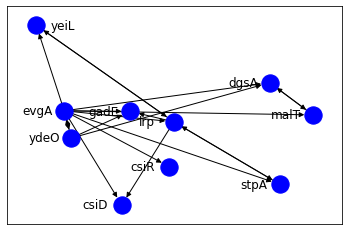

In [7]:
bG = nx.DiGraph()
for j in range(nodes):
    bG.add_node(gene_name[j])
    
# for (v1,v2,_) in mf_e[:basis_e]:
for (v1,v2) in mf_e[:20]:
    bG.add_edge(v1, v2)

nx.draw_networkx_edges(bG, npos, alpha=1.0)
nx.draw_networkx_nodes(bG, npos, node_color='b',alpha=1.0)
nx.draw_networkx_labels(bG,pos=lpos)
plt.show()

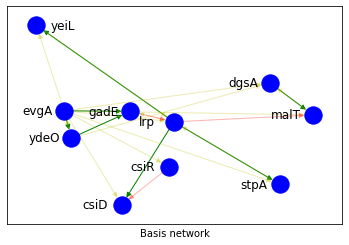

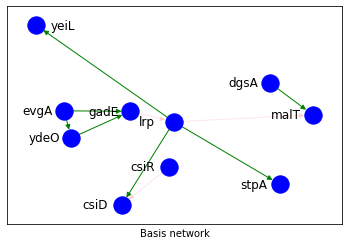

In [25]:
draw_graph(mf_e[:20], gtG=gtG, npos=npos, lpos=lpos)

# m40cc50

In [9]:
nw_fname='/home/linaiqi/Lab/data/gene/res/mf10gene/gpgene_10nw_cc50_m40'
fig_path='./res/m40c50/'

with open(nw_fname, 'rb') as f:
    nps = np.load(f)
    nw, pred, var = nps['nw'], nps['pred'], nps['var']

Time step: 0


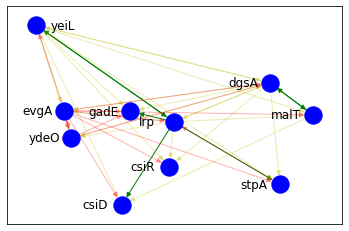

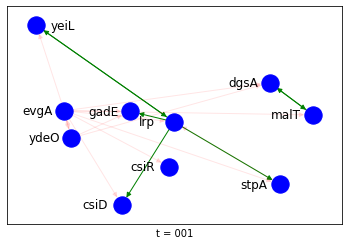

Time step: 1


<Figure size 432x288 with 0 Axes>

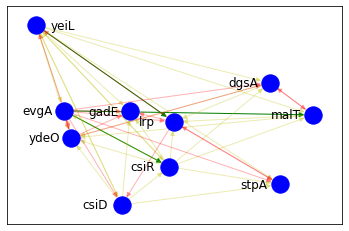

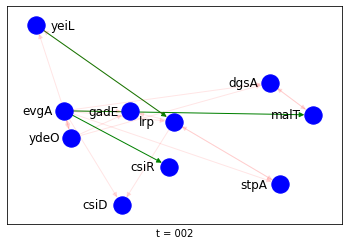

Time step: 2


<Figure size 432x288 with 0 Axes>

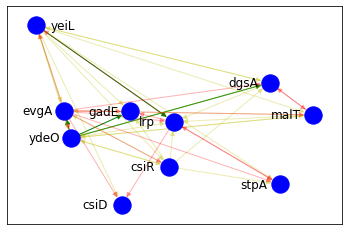

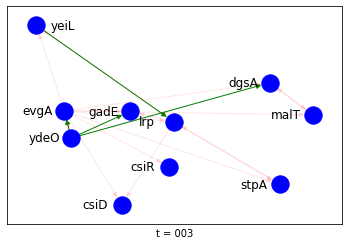

Time step: 3


<Figure size 432x288 with 0 Axes>

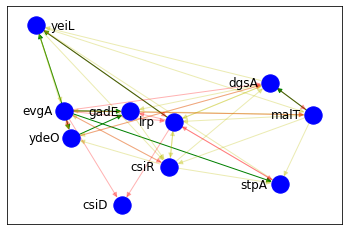

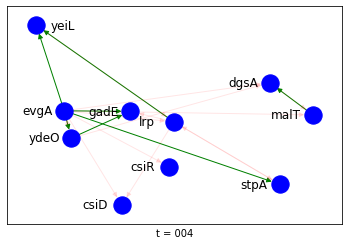

Time step: 4


<Figure size 432x288 with 0 Axes>

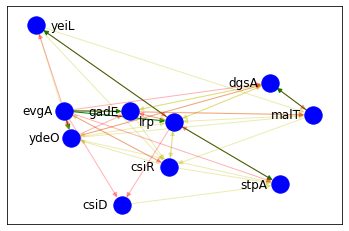

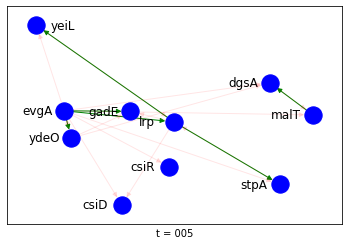

Time step: 5


<Figure size 432x288 with 0 Axes>

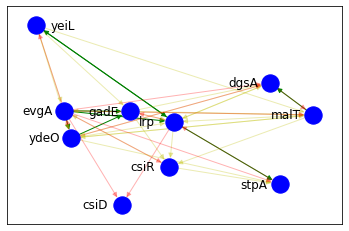

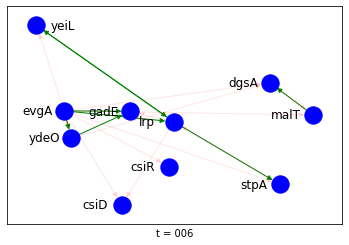

Time step: 6


<Figure size 432x288 with 0 Axes>

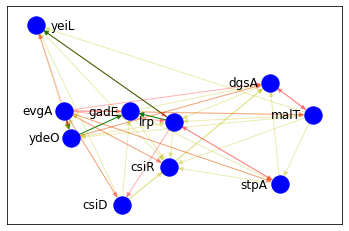

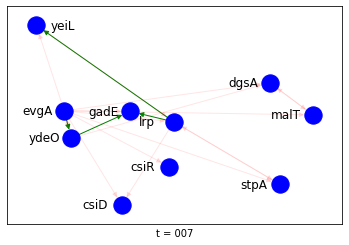

Time step: 7


<Figure size 432x288 with 0 Axes>

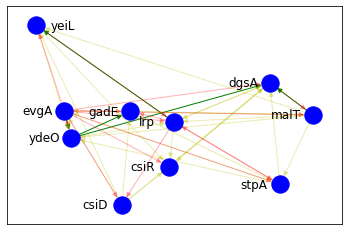

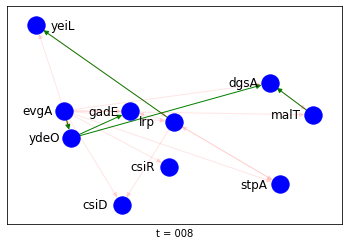

Time step: 8


<Figure size 432x288 with 0 Axes>

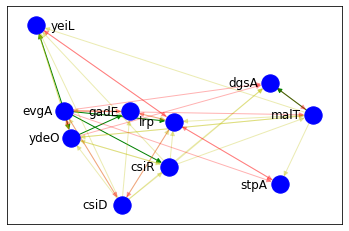

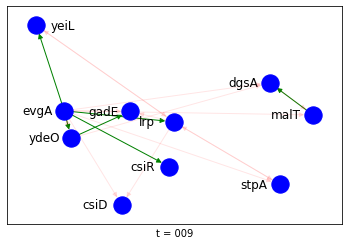

Time step: 9


<Figure size 432x288 with 0 Axes>

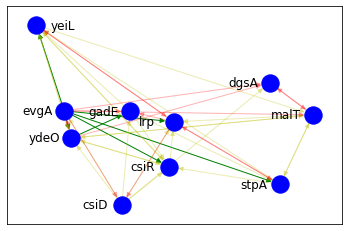

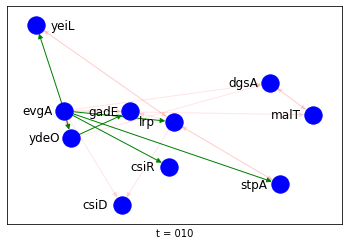

Time step: 10


<Figure size 432x288 with 0 Axes>

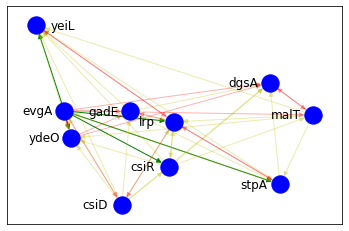

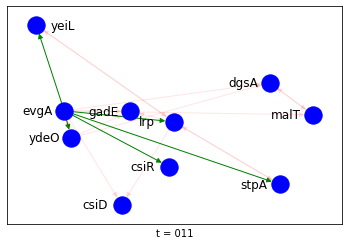

Time step: 11


<Figure size 432x288 with 0 Axes>

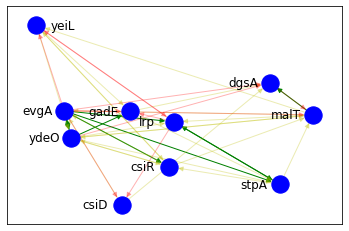

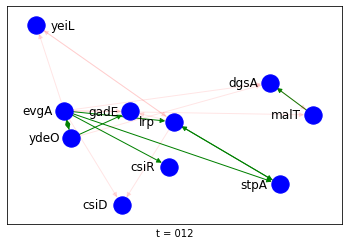

Time step: 12


<Figure size 432x288 with 0 Axes>

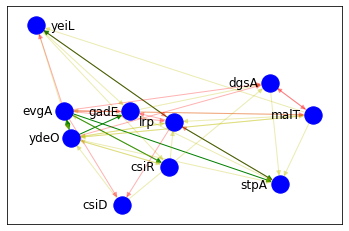

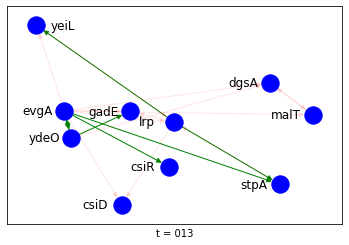

Time step: 13


<Figure size 432x288 with 0 Axes>

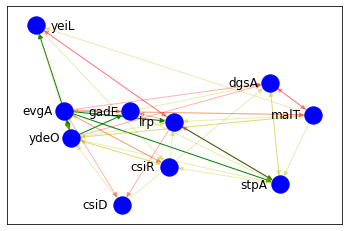

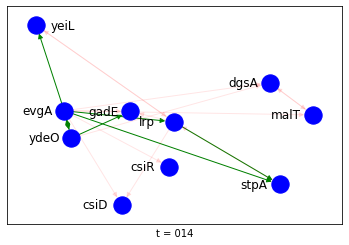

Time step: 14


<Figure size 432x288 with 0 Axes>

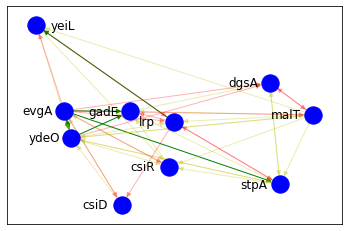

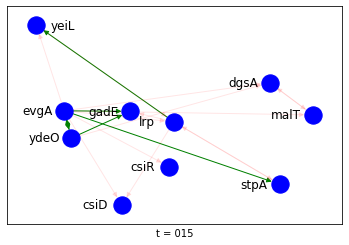

Time step: 15


<Figure size 432x288 with 0 Axes>

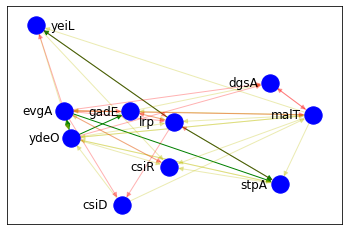

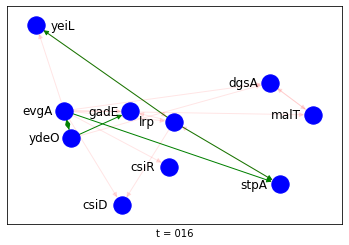

Time step: 16


<Figure size 432x288 with 0 Axes>

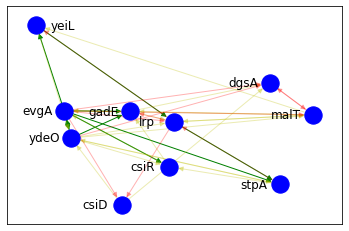

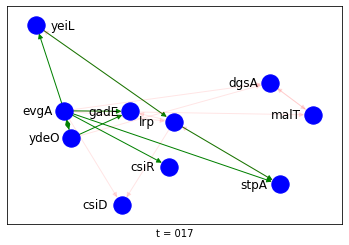

Time step: 17


<Figure size 432x288 with 0 Axes>

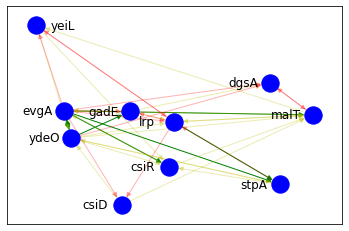

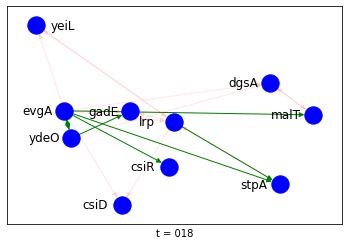

Time step: 18


<Figure size 432x288 with 0 Axes>

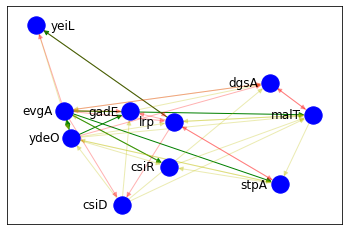

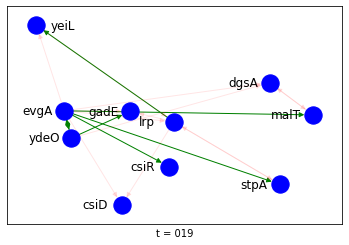

Time step: 19


<Figure size 432x288 with 0 Axes>

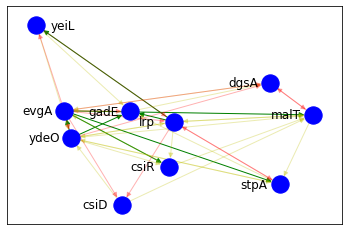

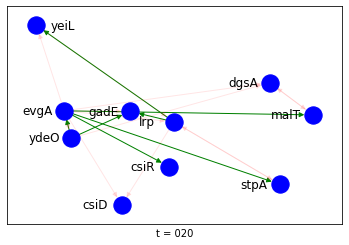

Time step: 20


<Figure size 432x288 with 0 Axes>

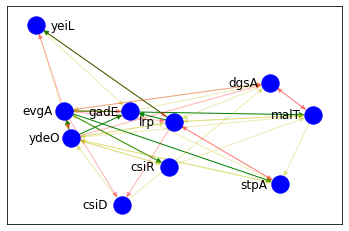

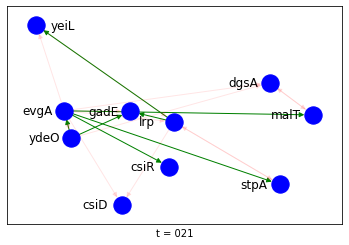

Time step: 21


<Figure size 432x288 with 0 Axes>

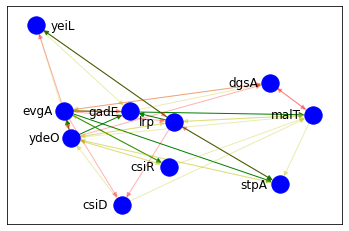

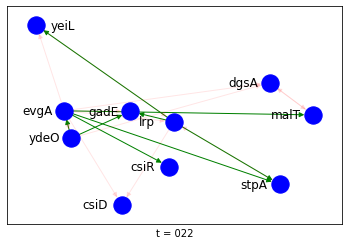

Time step: 22


<Figure size 432x288 with 0 Axes>

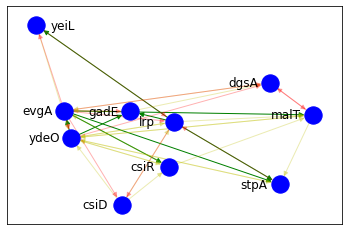

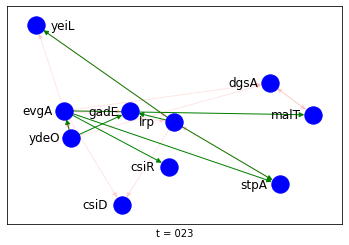

Time step: 23


<Figure size 432x288 with 0 Axes>

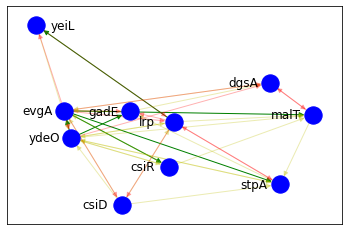

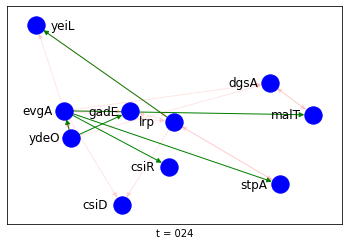

Time step: 24


<Figure size 432x288 with 0 Axes>

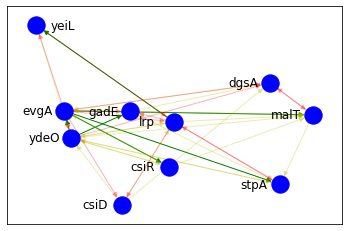

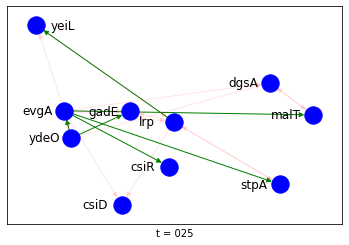

Time step: 25


<Figure size 432x288 with 0 Axes>

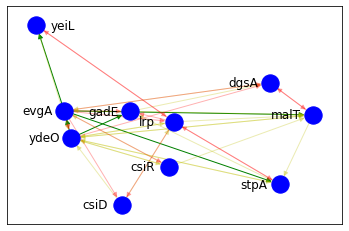

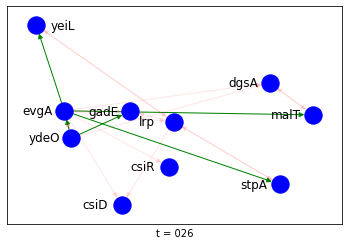

Time step: 26


<Figure size 432x288 with 0 Axes>

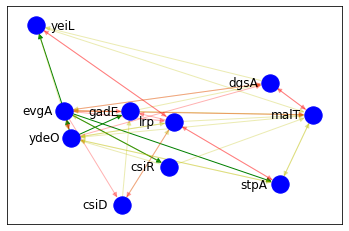

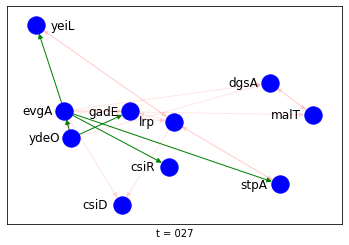

Time step: 27


<Figure size 432x288 with 0 Axes>

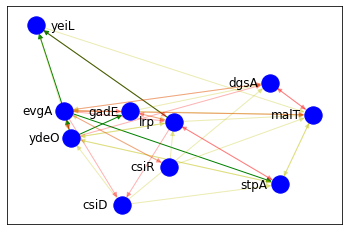

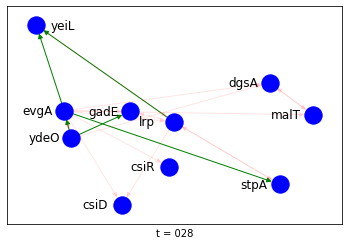

Time step: 28


<Figure size 432x288 with 0 Axes>

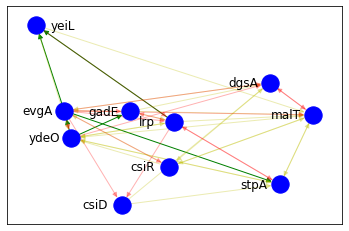

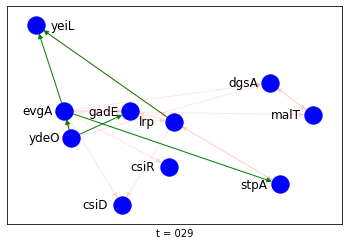

Time step: 29


<Figure size 432x288 with 0 Axes>

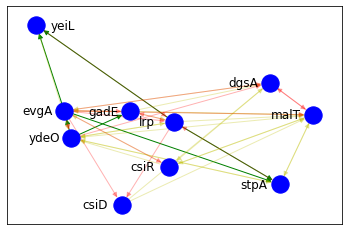

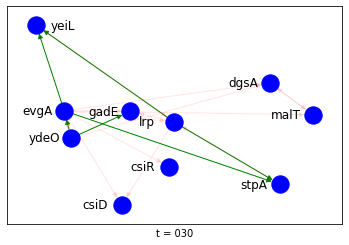

Time step: 30


<Figure size 432x288 with 0 Axes>

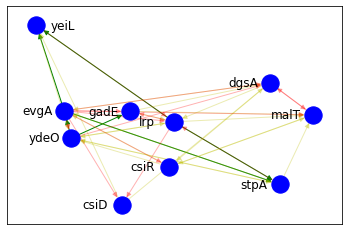

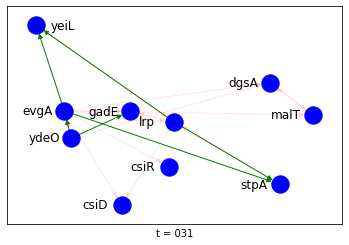

Time step: 31


<Figure size 432x288 with 0 Axes>

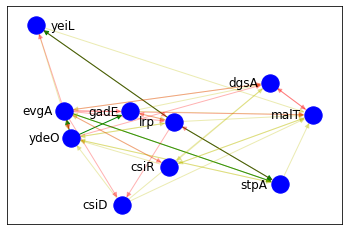

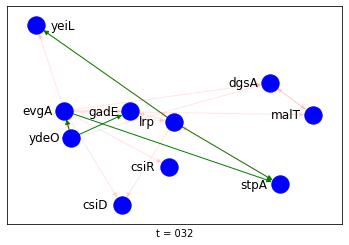

Time step: 32


<Figure size 432x288 with 0 Axes>

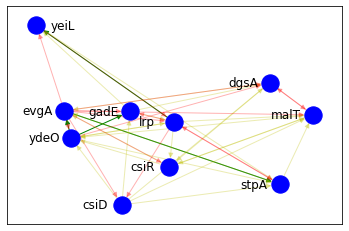

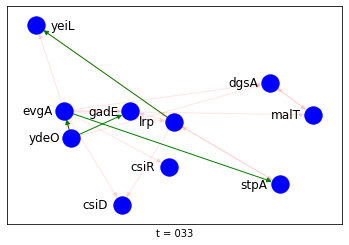

Time step: 33


<Figure size 432x288 with 0 Axes>

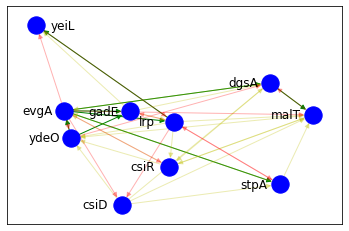

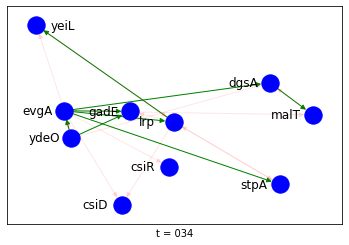

Time step: 34


<Figure size 432x288 with 0 Axes>

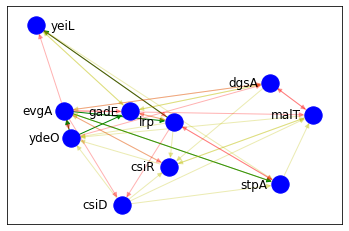

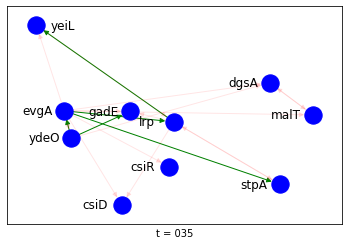

Time step: 35


<Figure size 432x288 with 0 Axes>

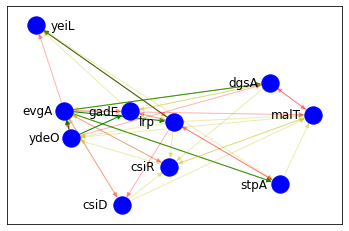

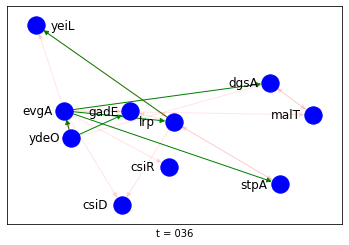

Time step: 36


<Figure size 432x288 with 0 Axes>

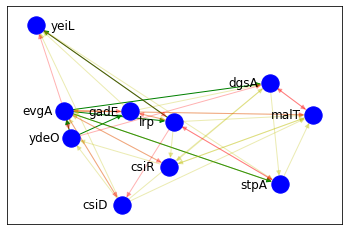

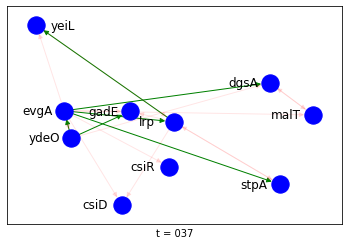

Time step: 37


<Figure size 432x288 with 0 Axes>

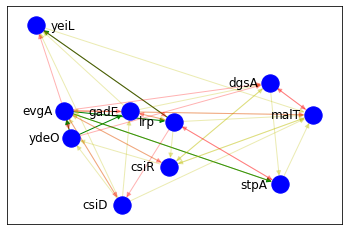

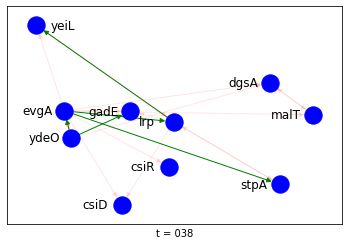

Time step: 38


<Figure size 432x288 with 0 Axes>

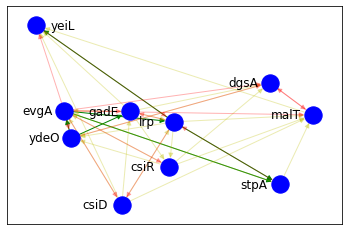

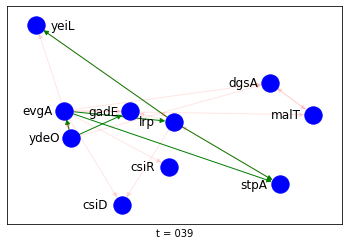

Time step: 39


<Figure size 432x288 with 0 Axes>

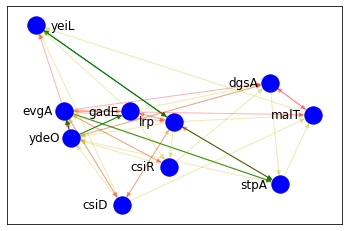

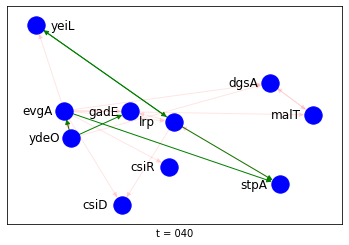

Time step: 40


<Figure size 432x288 with 0 Axes>

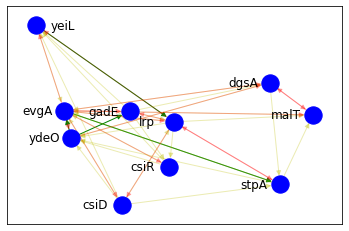

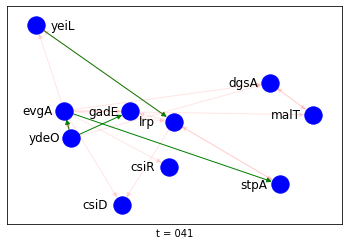

Time step: 41


<Figure size 432x288 with 0 Axes>

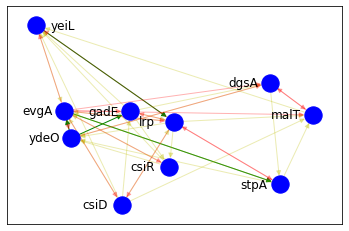

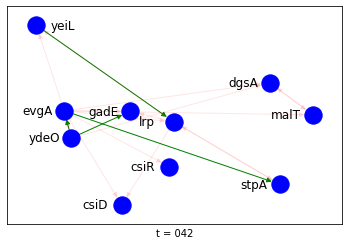

Time step: 42


<Figure size 432x288 with 0 Axes>

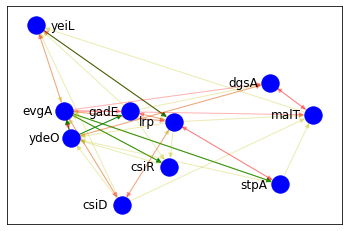

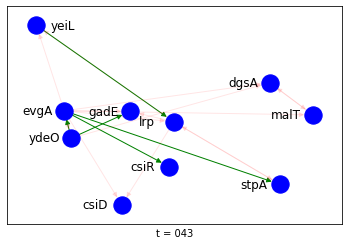

Time step: 43


<Figure size 432x288 with 0 Axes>

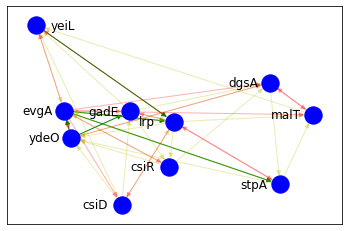

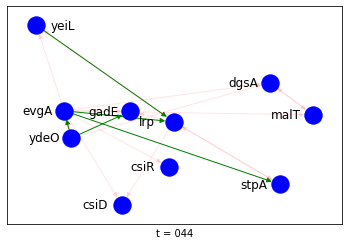

Time step: 44


<Figure size 432x288 with 0 Axes>

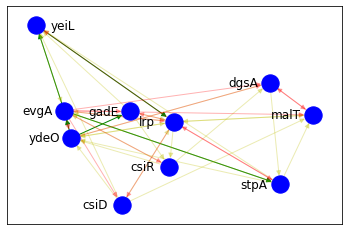

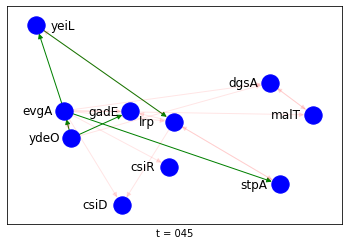

Time step: 45


<Figure size 432x288 with 0 Axes>

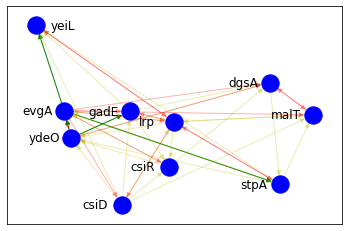

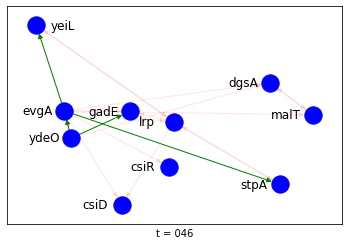

Time step: 46


<Figure size 432x288 with 0 Axes>

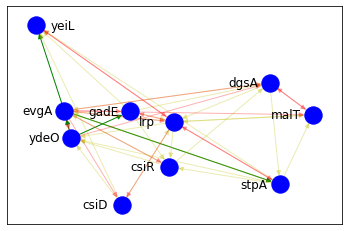

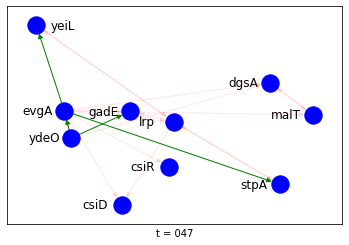

Time step: 47


<Figure size 432x288 with 0 Axes>

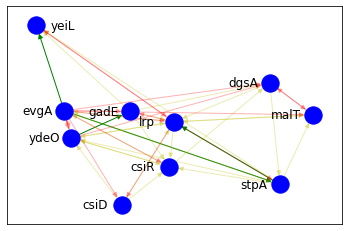

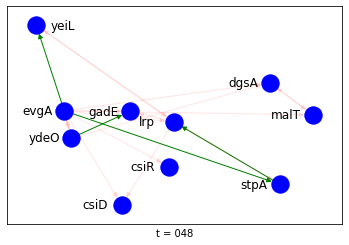

Time step: 48


<Figure size 432x288 with 0 Axes>

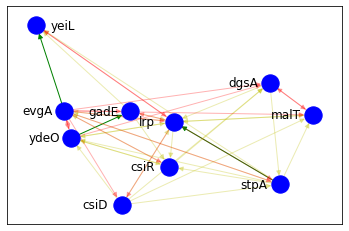

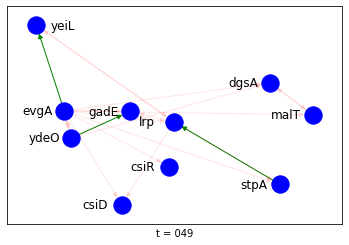

Time step: 49


<Figure size 432x288 with 0 Axes>

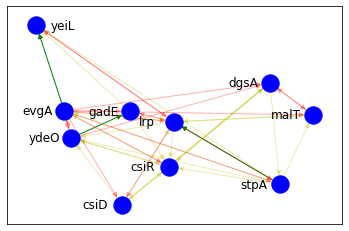

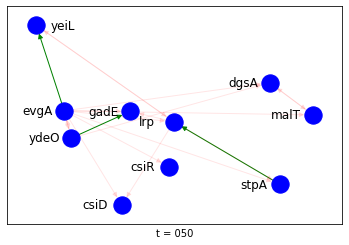

Time step: 50


<Figure size 432x288 with 0 Axes>

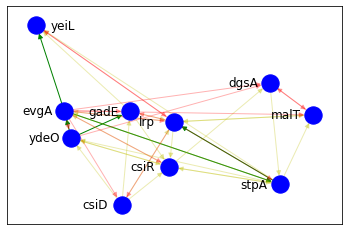

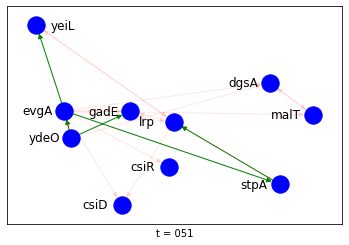

Time step: 51


<Figure size 432x288 with 0 Axes>

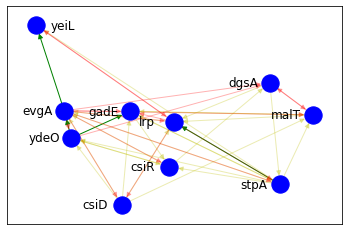

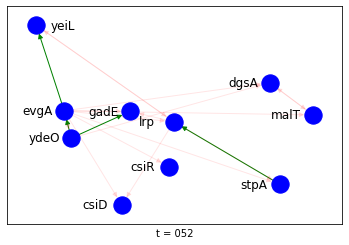

Time step: 52


<Figure size 432x288 with 0 Axes>

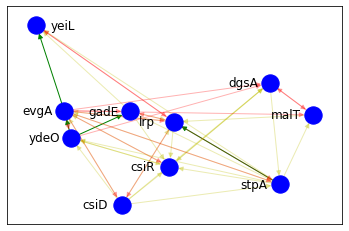

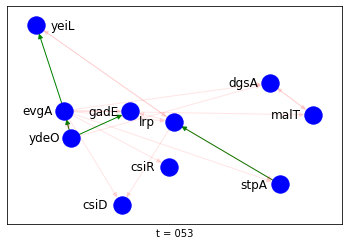

Time step: 53


<Figure size 432x288 with 0 Axes>

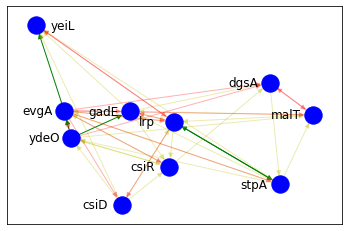

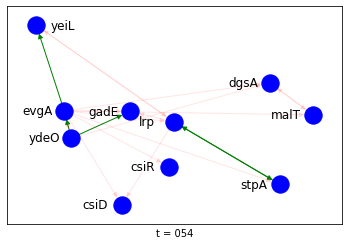

Time step: 54


<Figure size 432x288 with 0 Axes>

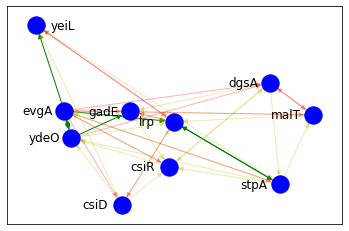

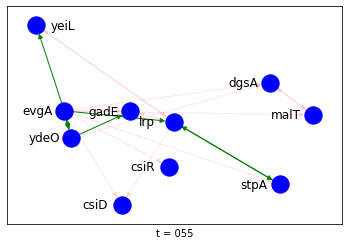

Time step: 55


<Figure size 432x288 with 0 Axes>

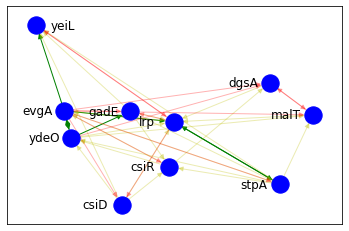

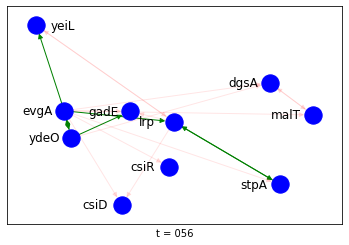

Time step: 56


<Figure size 432x288 with 0 Axes>

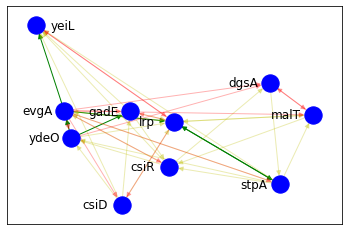

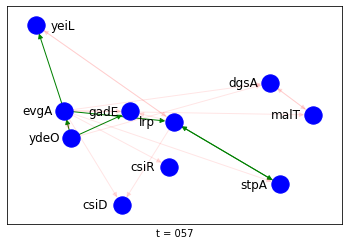

Time step: 57


<Figure size 432x288 with 0 Axes>

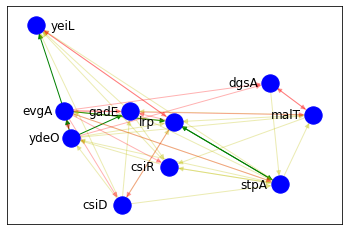

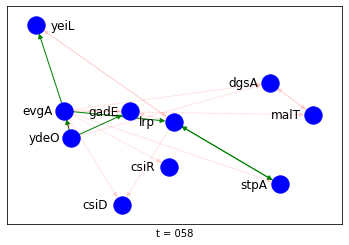

Time step: 58


<Figure size 432x288 with 0 Axes>

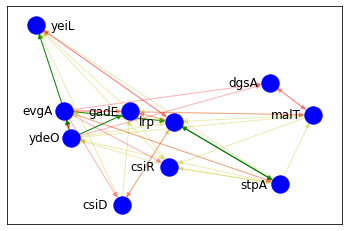

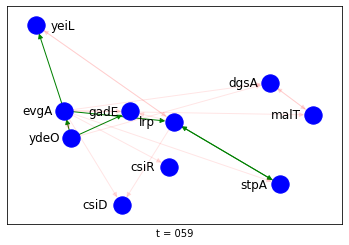

Time step: 59


<Figure size 432x288 with 0 Axes>

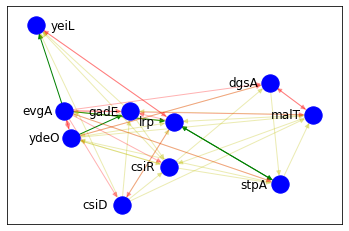

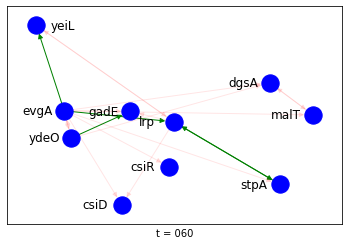

Time step: 60


<Figure size 432x288 with 0 Axes>

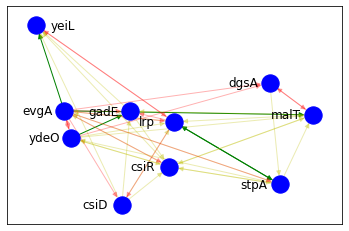

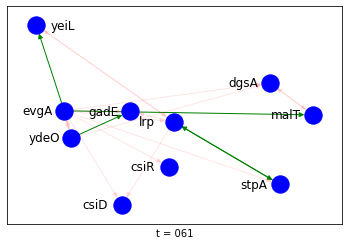

Time step: 61


<Figure size 432x288 with 0 Axes>

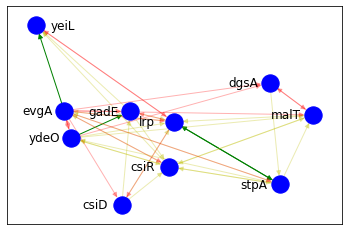

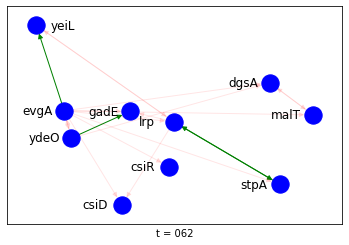

Time step: 62


<Figure size 432x288 with 0 Axes>

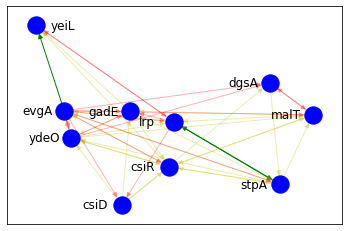

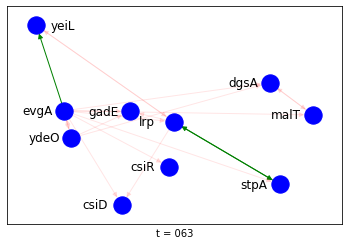

Time step: 63


<Figure size 432x288 with 0 Axes>

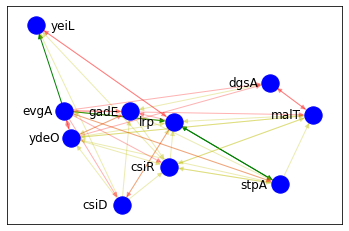

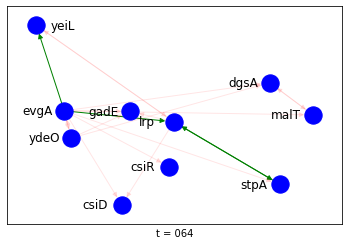

Time step: 64


<Figure size 432x288 with 0 Axes>

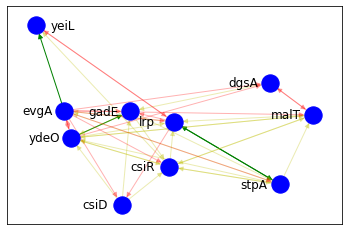

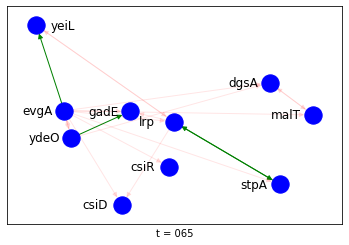

Time step: 65


<Figure size 432x288 with 0 Axes>

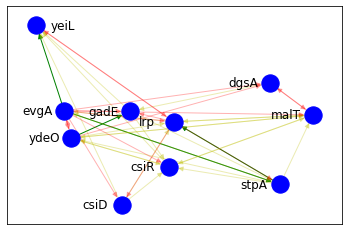

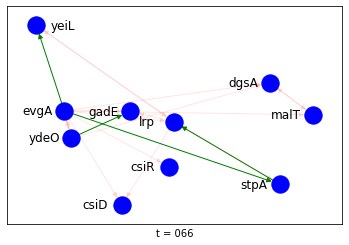

Time step: 66


<Figure size 432x288 with 0 Axes>

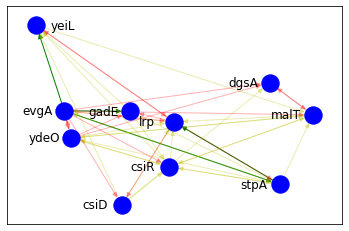

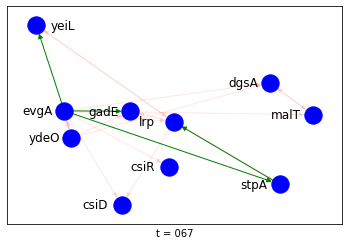

Time step: 67


<Figure size 432x288 with 0 Axes>

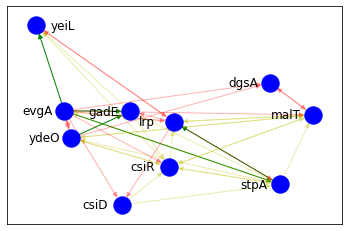

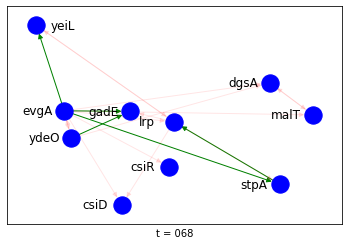

Time step: 68


<Figure size 432x288 with 0 Axes>

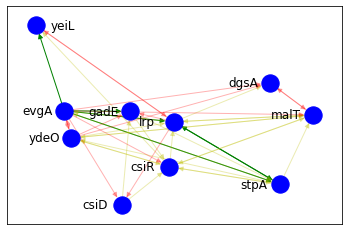

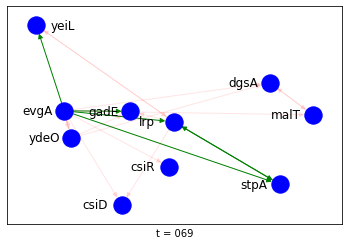

Time step: 69


<Figure size 432x288 with 0 Axes>

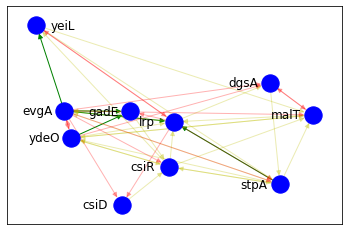

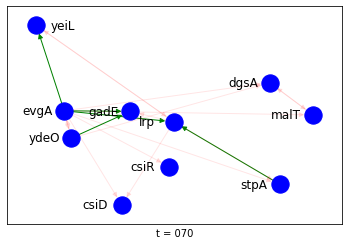

Time step: 70


<Figure size 432x288 with 0 Axes>

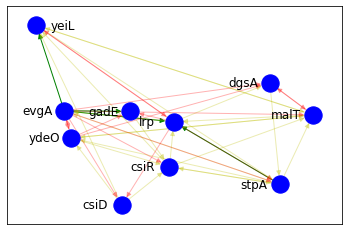

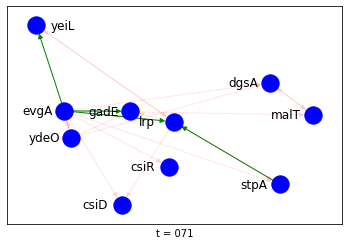

Time step: 71


<Figure size 432x288 with 0 Axes>

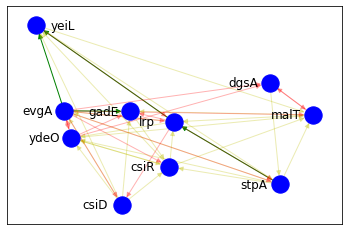

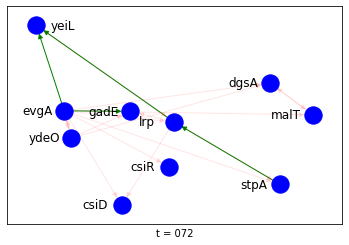

Time step: 72


<Figure size 432x288 with 0 Axes>

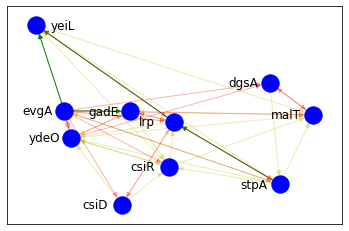

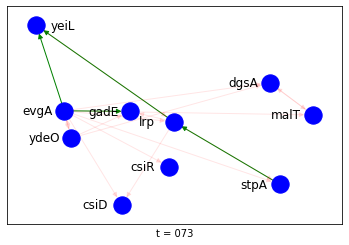

Time step: 73


<Figure size 432x288 with 0 Axes>

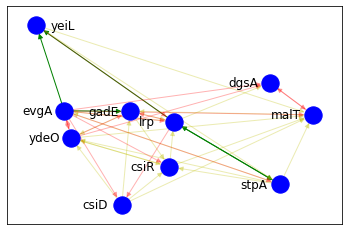

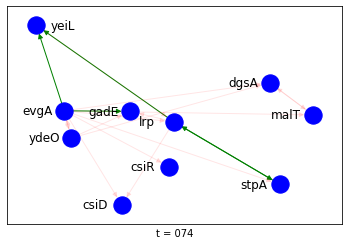

Time step: 74


<Figure size 432x288 with 0 Axes>

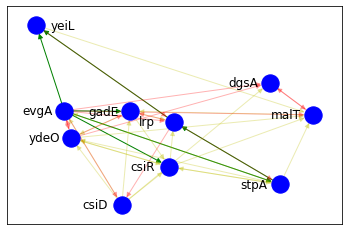

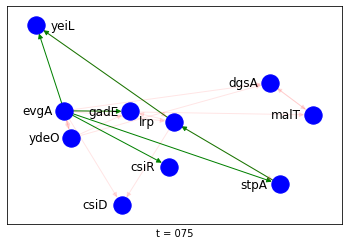

Time step: 75


<Figure size 432x288 with 0 Axes>

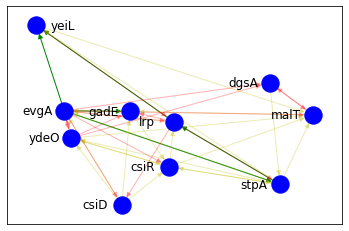

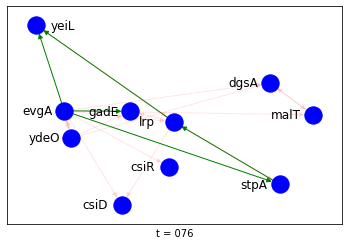

Time step: 76


<Figure size 432x288 with 0 Axes>

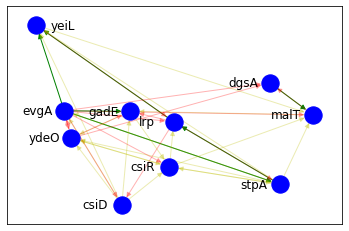

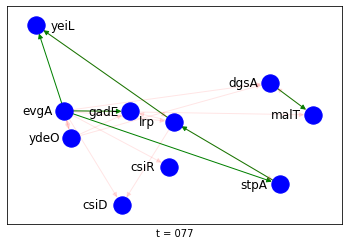

Time step: 77


<Figure size 432x288 with 0 Axes>

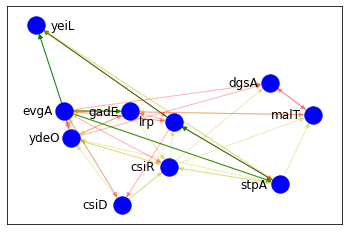

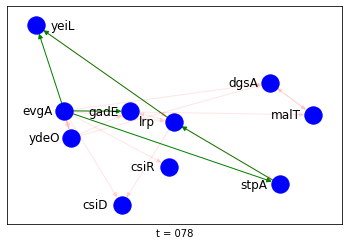

Time step: 78


<Figure size 432x288 with 0 Axes>

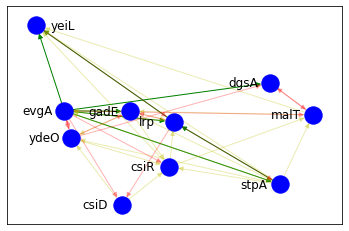

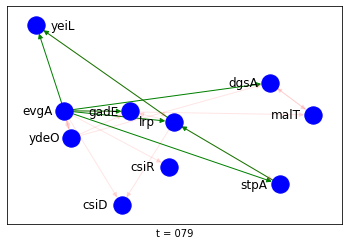

Time step: 79


<Figure size 432x288 with 0 Axes>

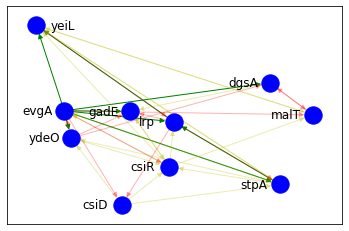

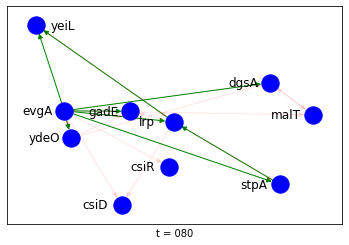

Time step: 80


<Figure size 432x288 with 0 Axes>

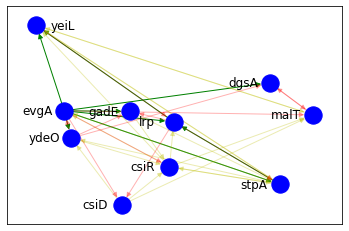

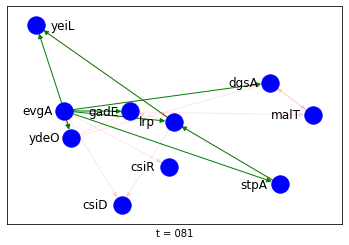

Time step: 81


<Figure size 432x288 with 0 Axes>

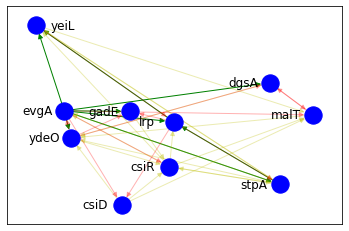

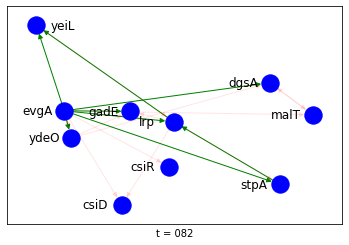

Time step: 82


<Figure size 432x288 with 0 Axes>

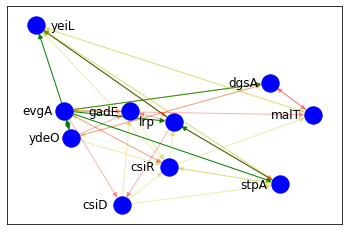

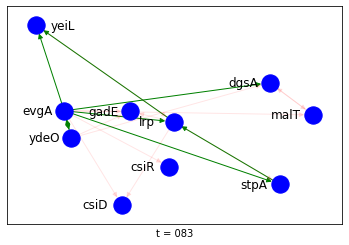

Time step: 83


<Figure size 432x288 with 0 Axes>

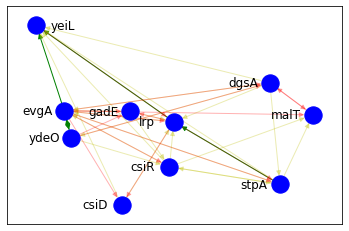

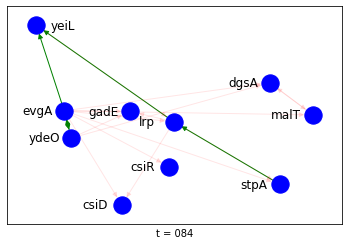

Time step: 84


<Figure size 432x288 with 0 Axes>

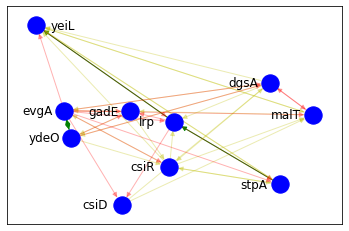

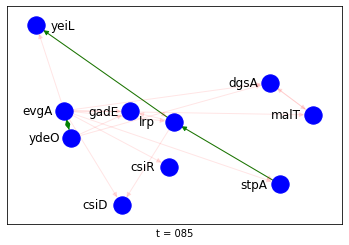

Time step: 85


<Figure size 432x288 with 0 Axes>

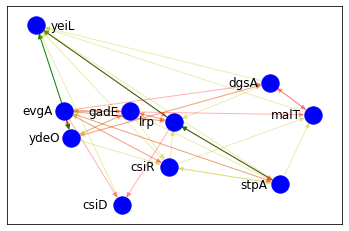

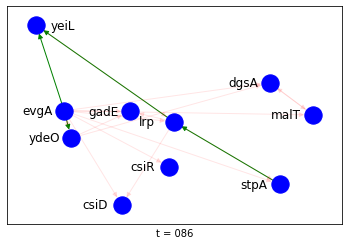

Time step: 86


<Figure size 432x288 with 0 Axes>

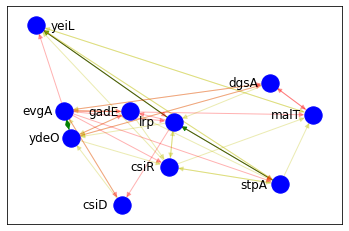

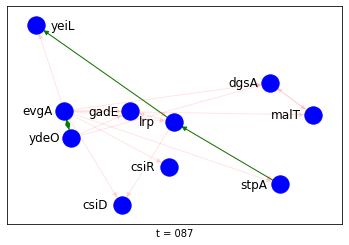

Time step: 87


<Figure size 432x288 with 0 Axes>

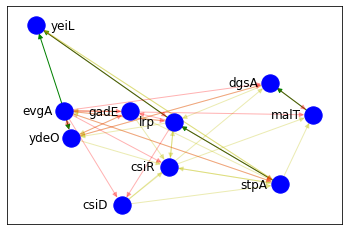

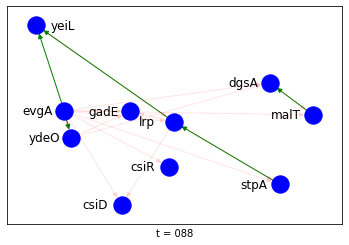

Time step: 88


<Figure size 432x288 with 0 Axes>

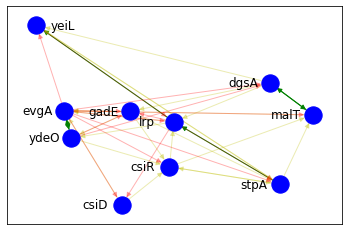

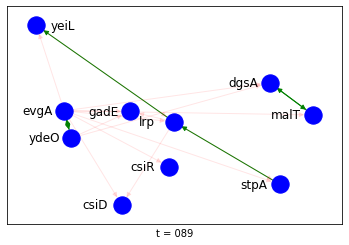

Time step: 89


<Figure size 432x288 with 0 Axes>

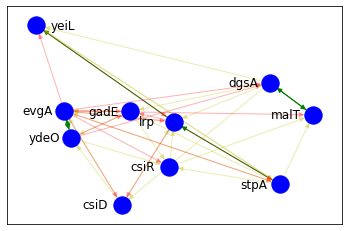

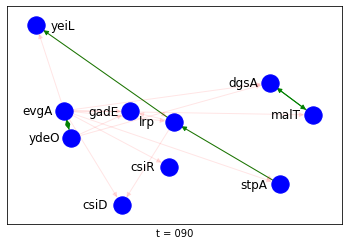

Time step: 90


<Figure size 432x288 with 0 Axes>

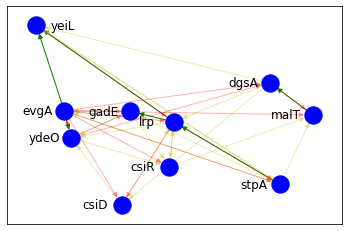

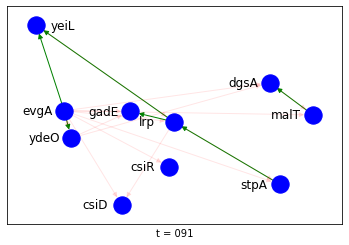

Time step: 91


<Figure size 432x288 with 0 Axes>

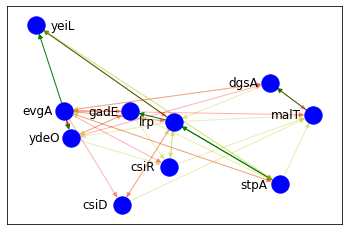

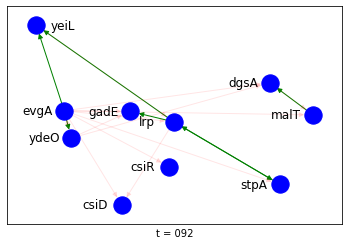

Time step: 92


<Figure size 432x288 with 0 Axes>

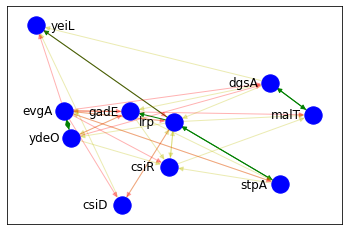

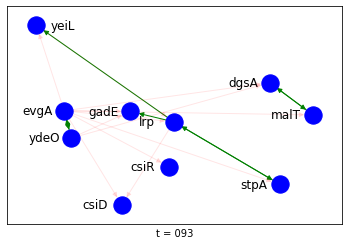

Time step: 93


<Figure size 432x288 with 0 Axes>

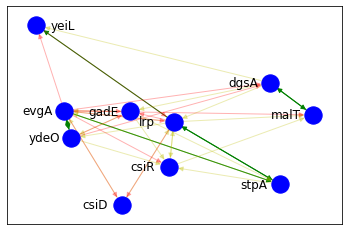

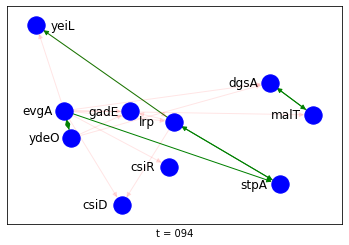

Time step: 94


<Figure size 432x288 with 0 Axes>

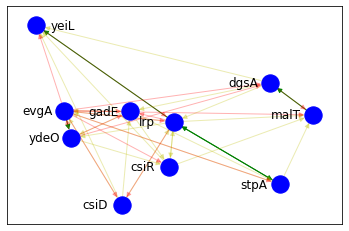

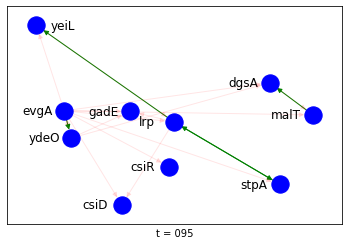

Time step: 95


<Figure size 432x288 with 0 Axes>

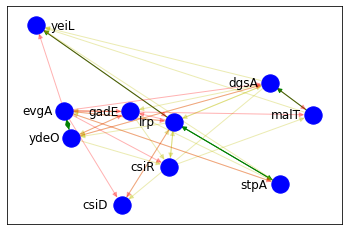

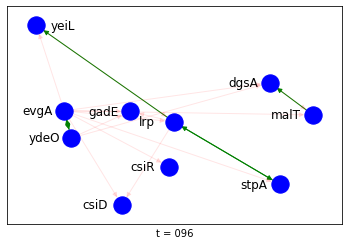

Time step: 96


<Figure size 432x288 with 0 Axes>

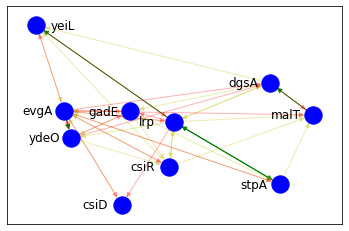

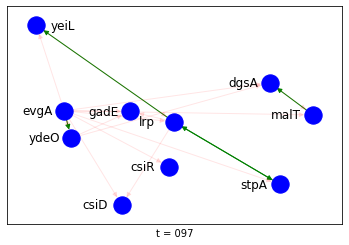

Time step: 97


<Figure size 432x288 with 0 Axes>

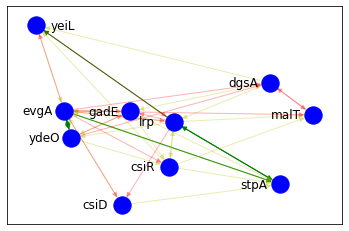

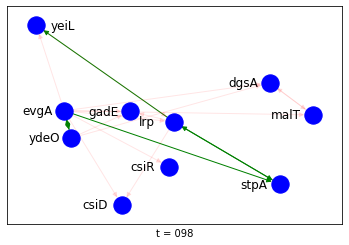

Time step: 98


<Figure size 432x288 with 0 Axes>

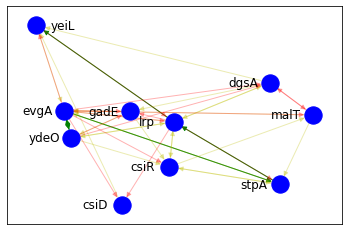

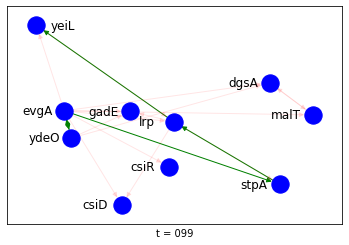

Time step: 99


<Figure size 432x288 with 0 Axes>

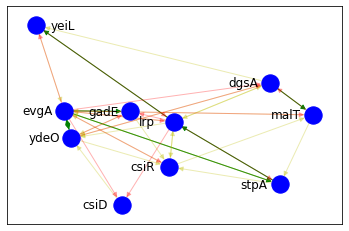

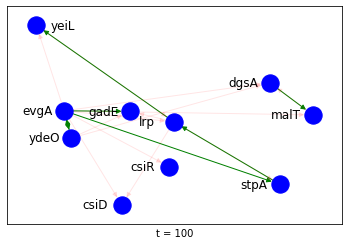

Time step: 100


<Figure size 432x288 with 0 Axes>

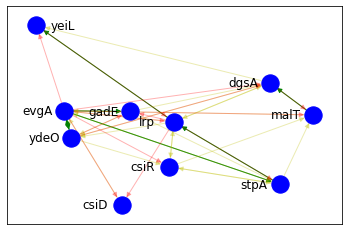

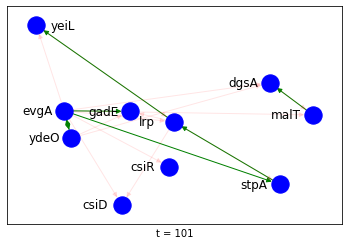

Time step: 101


<Figure size 432x288 with 0 Axes>

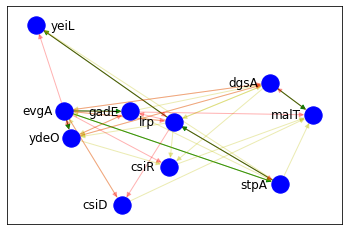

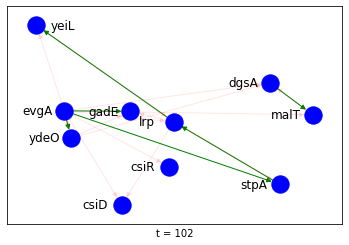

Time step: 102


<Figure size 432x288 with 0 Axes>

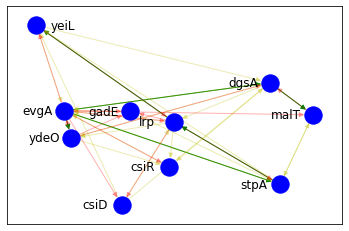

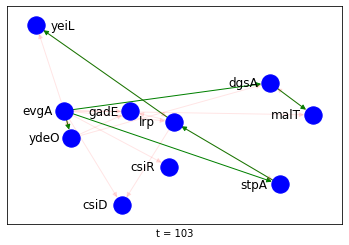

Time step: 103


<Figure size 432x288 with 0 Axes>

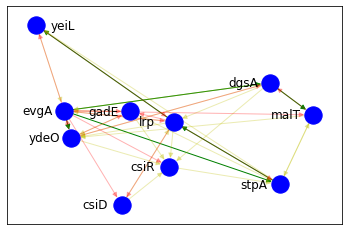

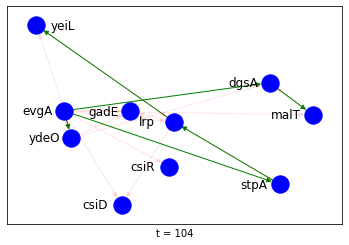

Time step: 104


<Figure size 432x288 with 0 Axes>

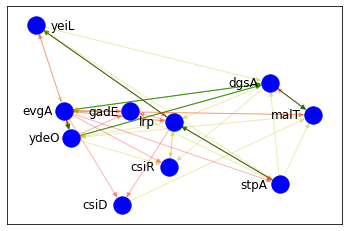

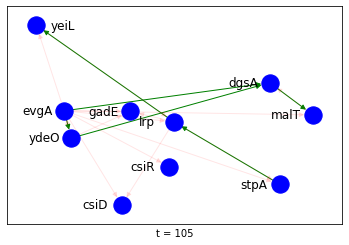

Time step: 105


<Figure size 432x288 with 0 Axes>

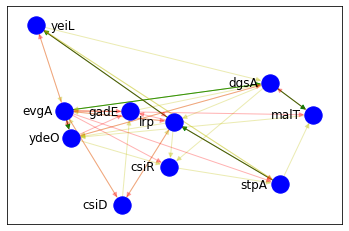

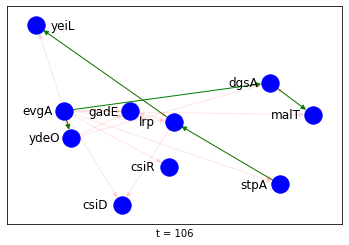

Time step: 106


<Figure size 432x288 with 0 Axes>

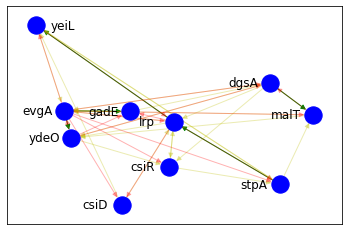

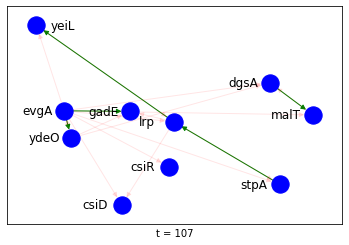

Time step: 107


<Figure size 432x288 with 0 Axes>

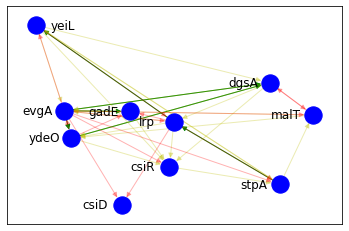

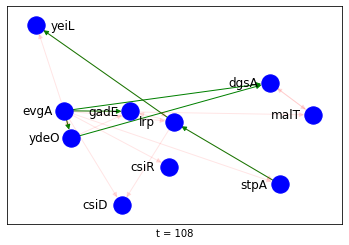

Time step: 108


<Figure size 432x288 with 0 Axes>

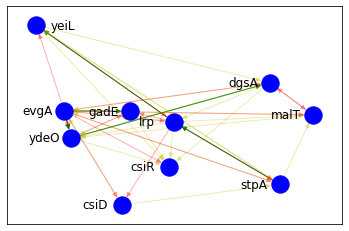

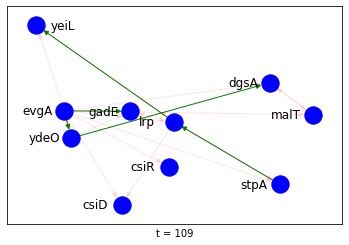

Time step: 109


<Figure size 432x288 with 0 Axes>

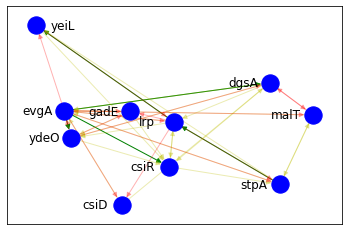

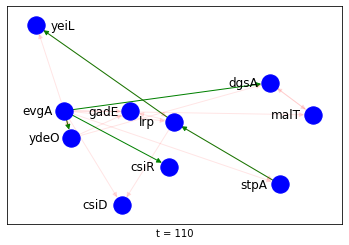

Time step: 110


<Figure size 432x288 with 0 Axes>

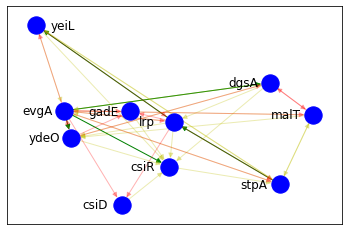

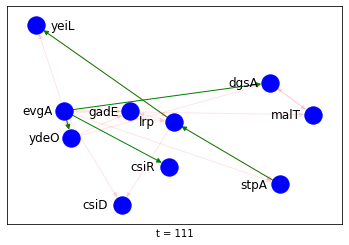

Time step: 111


<Figure size 432x288 with 0 Axes>

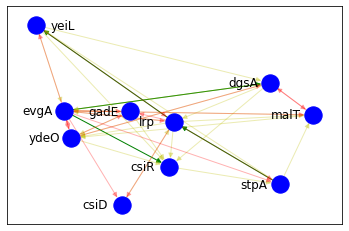

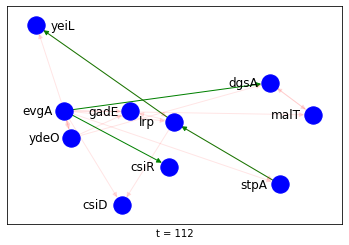

Time step: 112


<Figure size 432x288 with 0 Axes>

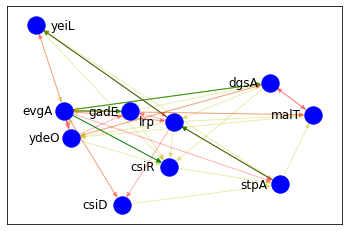

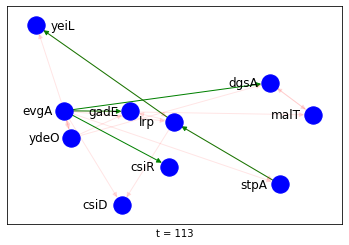

Time step: 113


<Figure size 432x288 with 0 Axes>

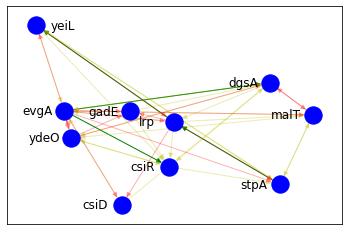

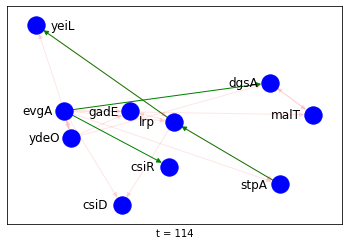

Time step: 114


<Figure size 432x288 with 0 Axes>

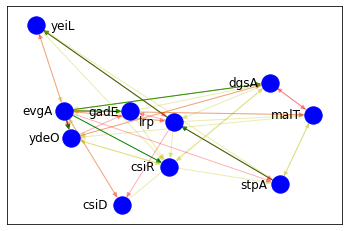

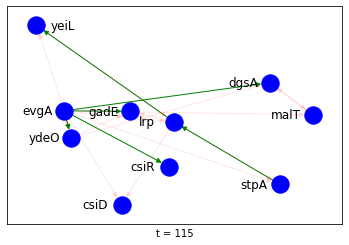

Time step: 115


<Figure size 432x288 with 0 Axes>

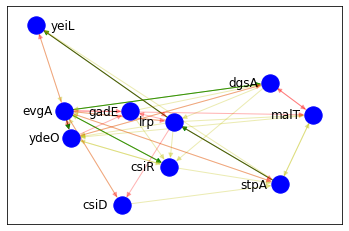

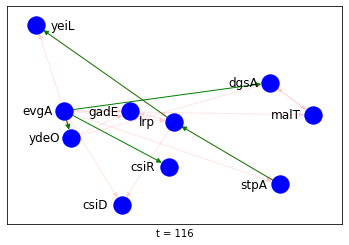

Time step: 116


<Figure size 432x288 with 0 Axes>

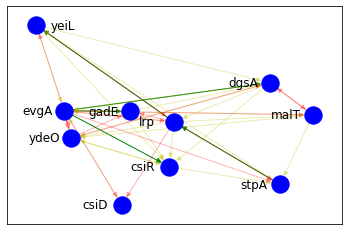

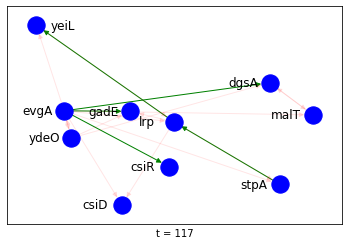

Time step: 117


<Figure size 432x288 with 0 Axes>

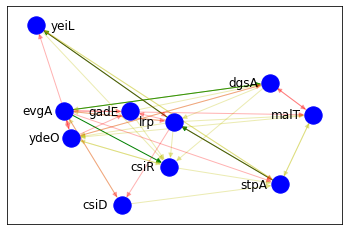

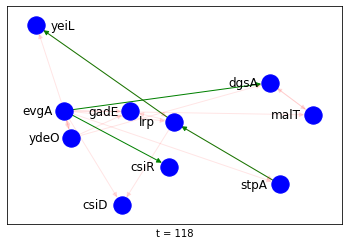

Time step: 118


<Figure size 432x288 with 0 Axes>

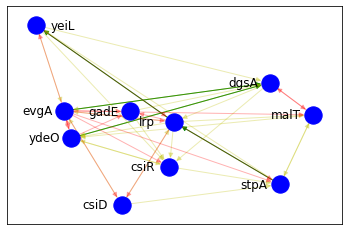

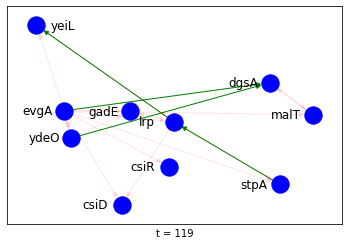

Time step: 119


<Figure size 432x288 with 0 Axes>

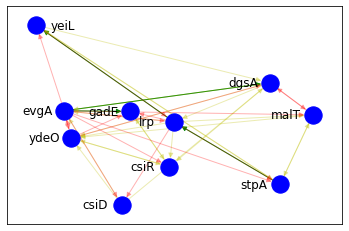

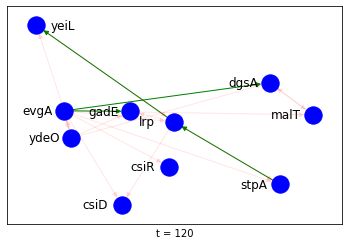

Time step: 120


<Figure size 432x288 with 0 Axes>

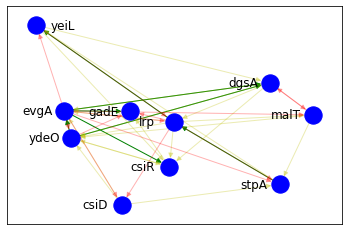

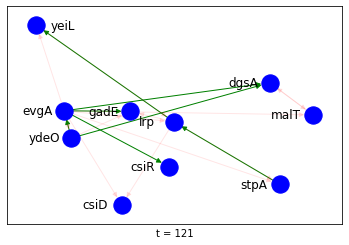

Time step: 121


<Figure size 432x288 with 0 Axes>

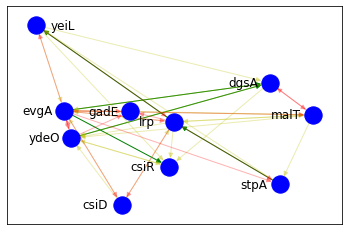

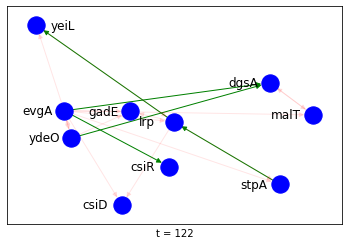

Time step: 122


<Figure size 432x288 with 0 Axes>

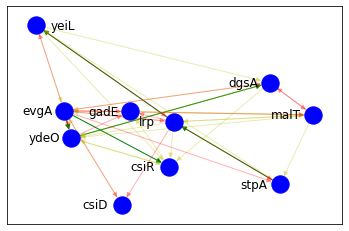

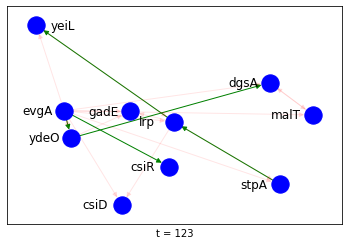

Time step: 123


<Figure size 432x288 with 0 Axes>

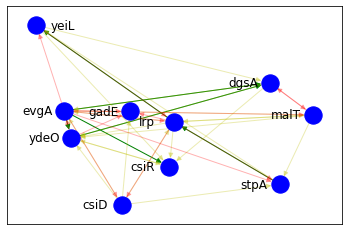

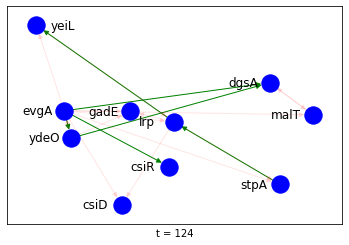

Time step: 124


<Figure size 432x288 with 0 Axes>

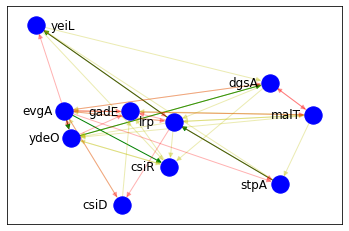

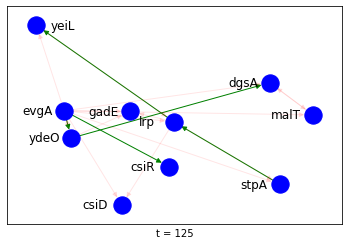

Time step: 125


<Figure size 432x288 with 0 Axes>

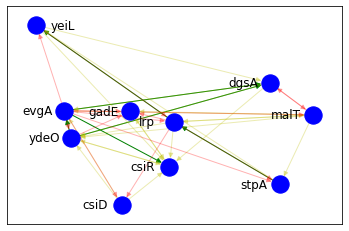

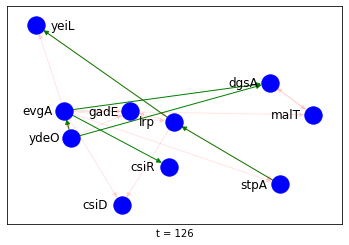

Time step: 126


<Figure size 432x288 with 0 Axes>

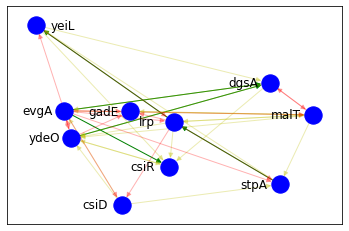

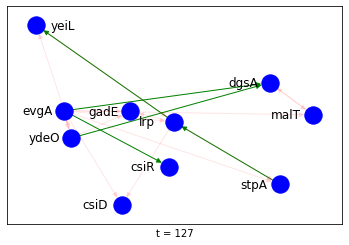

Time step: 127


<Figure size 432x288 with 0 Axes>

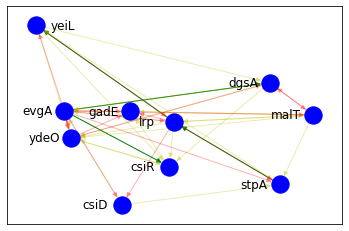

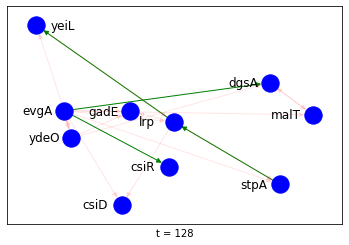

Time step: 128


<Figure size 432x288 with 0 Axes>

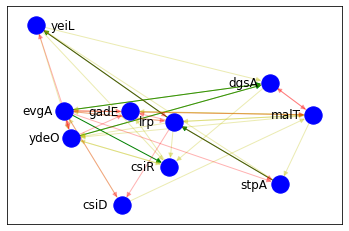

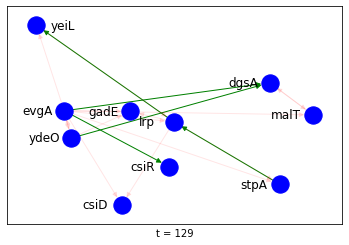

Time step: 129


<Figure size 432x288 with 0 Axes>

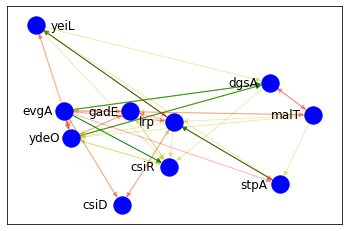

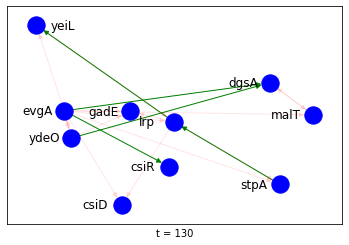

Time step: 130


<Figure size 432x288 with 0 Axes>

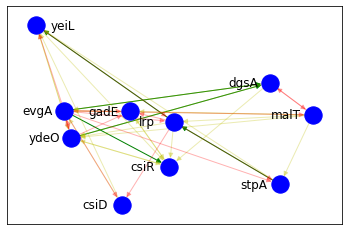

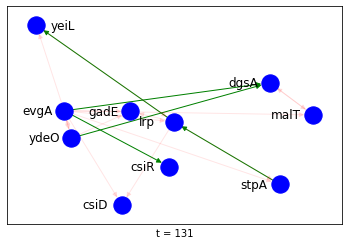

Time step: 131


<Figure size 432x288 with 0 Axes>

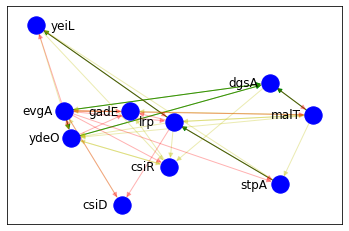

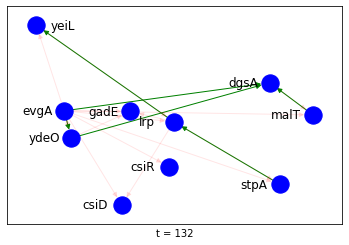

Time step: 132


<Figure size 432x288 with 0 Axes>

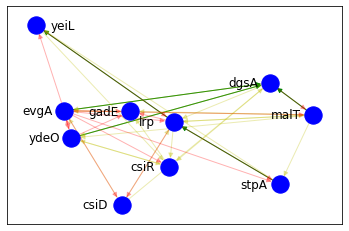

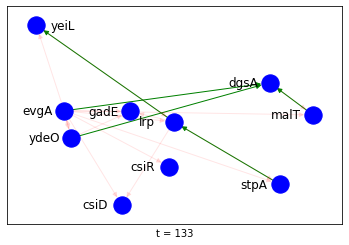

Time step: 133


<Figure size 432x288 with 0 Axes>

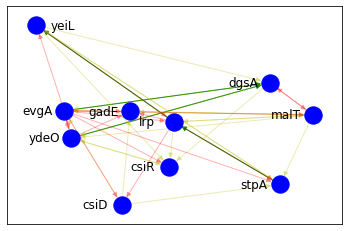

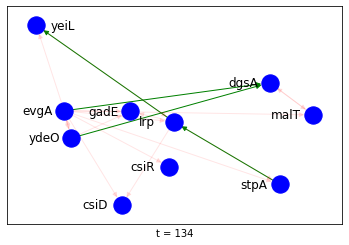

Time step: 134


<Figure size 432x288 with 0 Axes>

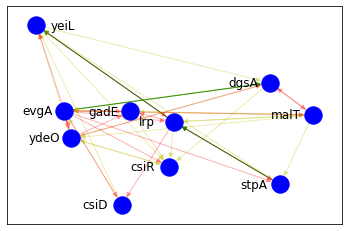

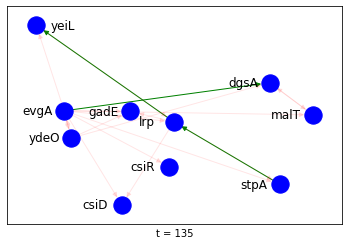

Time step: 135


<Figure size 432x288 with 0 Axes>

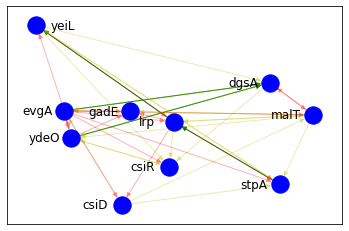

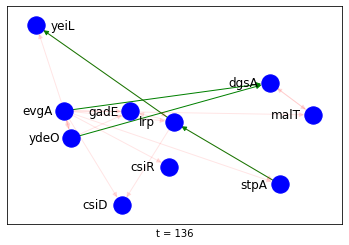

Time step: 136


<Figure size 432x288 with 0 Axes>

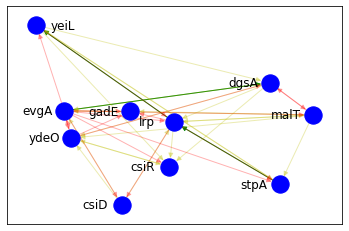

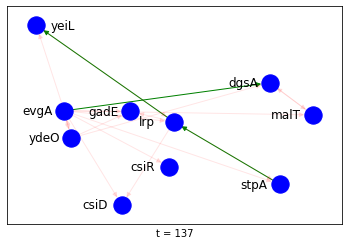

Time step: 137


<Figure size 432x288 with 0 Axes>

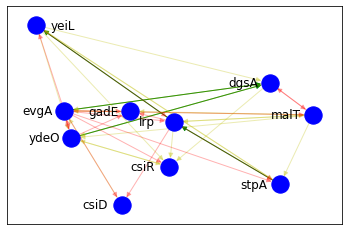

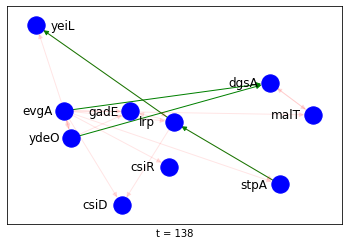

Time step: 138


<Figure size 432x288 with 0 Axes>

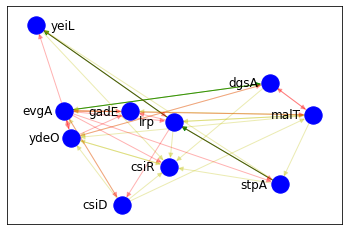

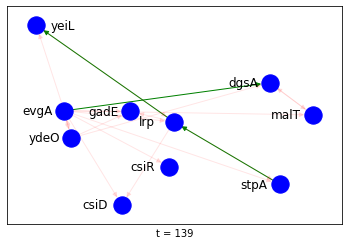

Time step: 139


<Figure size 432x288 with 0 Axes>

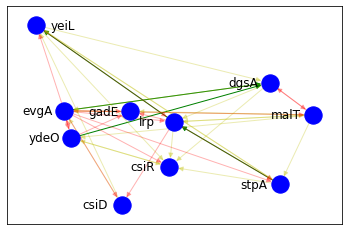

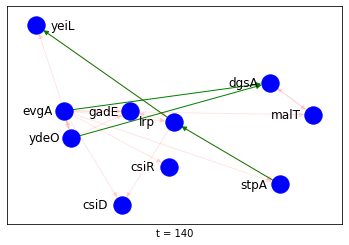

Time step: 140


<Figure size 432x288 with 0 Axes>

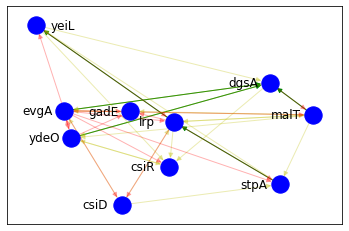

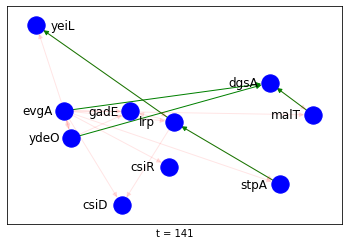

Time step: 141


<Figure size 432x288 with 0 Axes>

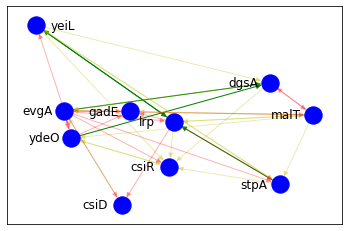

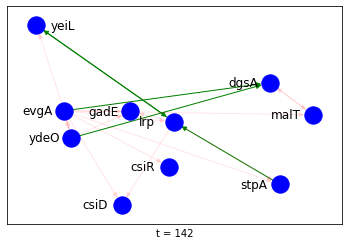

Time step: 142


<Figure size 432x288 with 0 Axes>

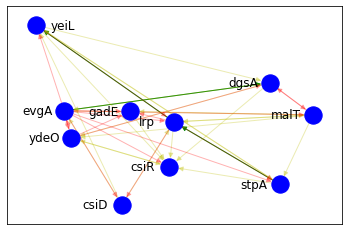

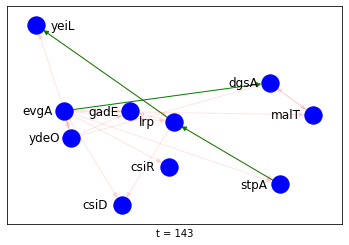

Time step: 143


<Figure size 432x288 with 0 Axes>

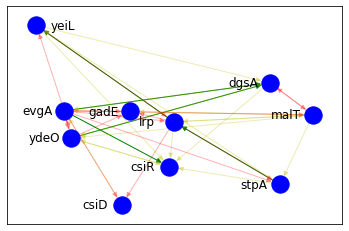

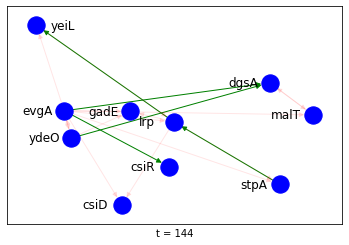

Time step: 144


<Figure size 432x288 with 0 Axes>

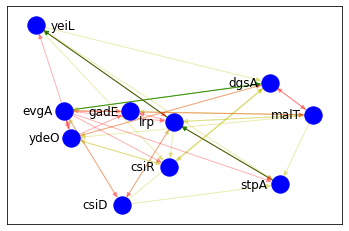

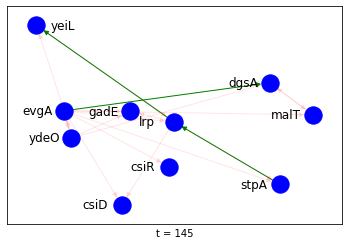

Time step: 145


<Figure size 432x288 with 0 Axes>

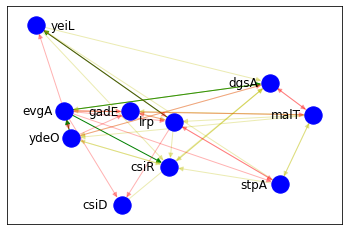

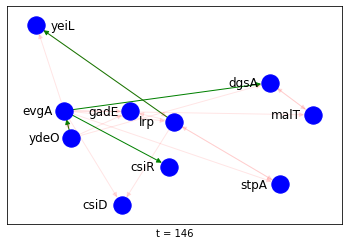

Time step: 146


<Figure size 432x288 with 0 Axes>

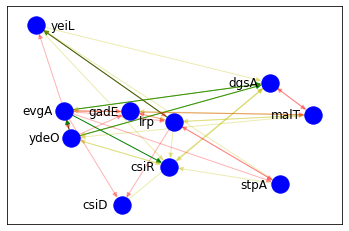

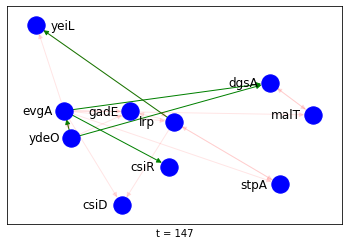

Time step: 147


<Figure size 432x288 with 0 Axes>

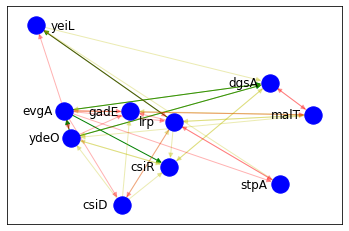

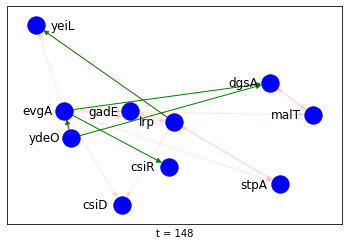

Time step: 148


<Figure size 432x288 with 0 Axes>

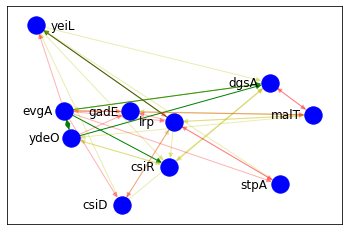

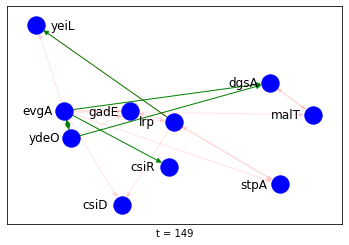

Time step: 149


<Figure size 432x288 with 0 Axes>

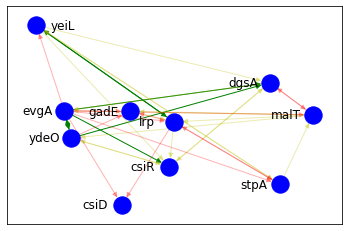

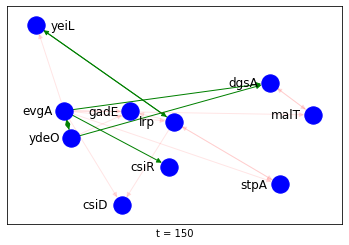

Time step: 150


<Figure size 432x288 with 0 Axes>

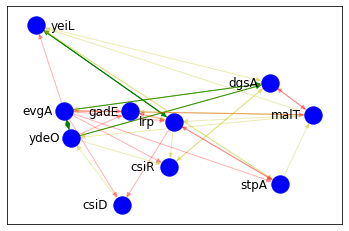

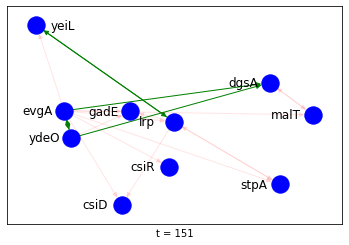

Time step: 151


<Figure size 432x288 with 0 Axes>

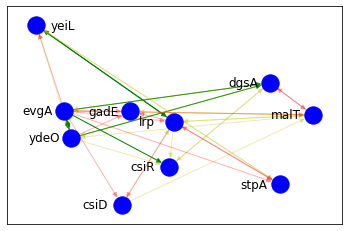

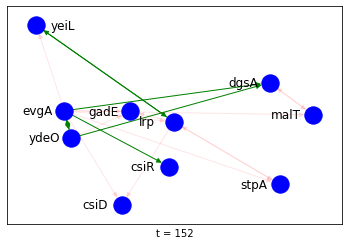

Time step: 152


<Figure size 432x288 with 0 Axes>

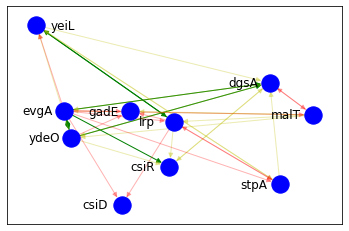

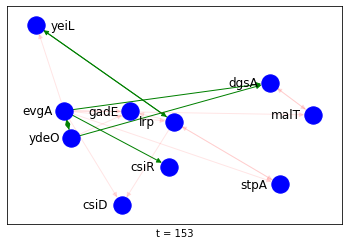

Time step: 153


<Figure size 432x288 with 0 Axes>

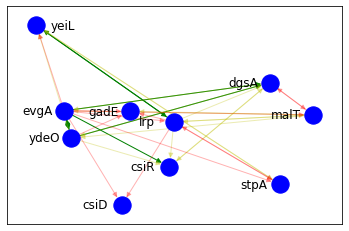

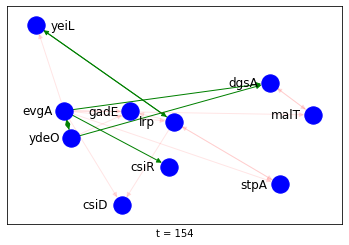

Time step: 154


<Figure size 432x288 with 0 Axes>

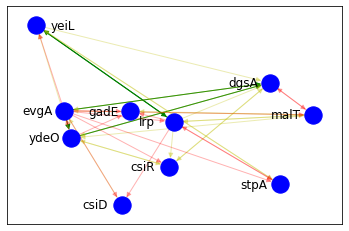

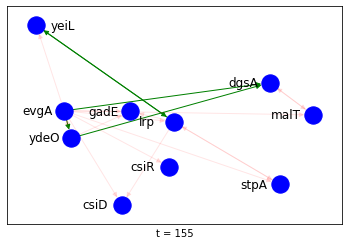

Time step: 155


<Figure size 432x288 with 0 Axes>

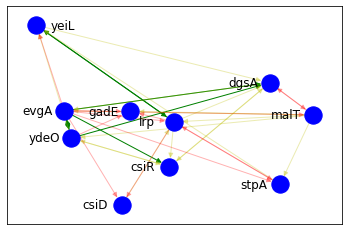

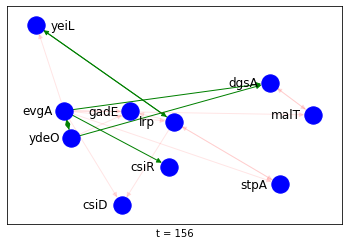

Time step: 156


<Figure size 432x288 with 0 Axes>

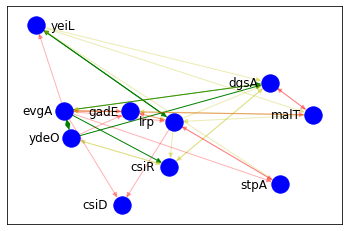

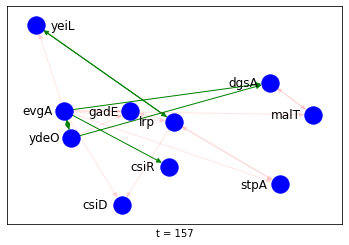

Time step: 157


<Figure size 432x288 with 0 Axes>

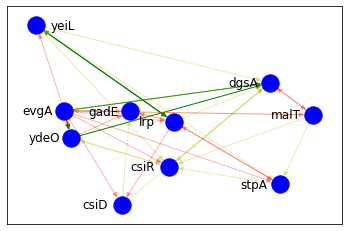

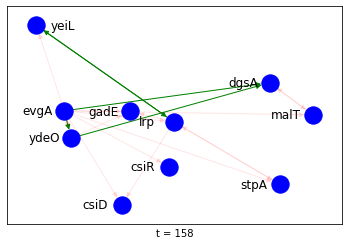

Time step: 158


<Figure size 432x288 with 0 Axes>

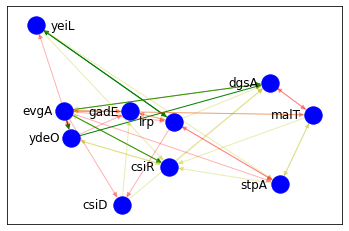

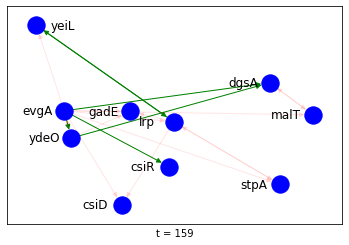

Time step: 159


<Figure size 432x288 with 0 Axes>

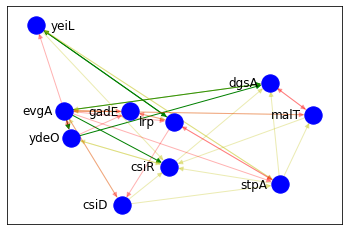

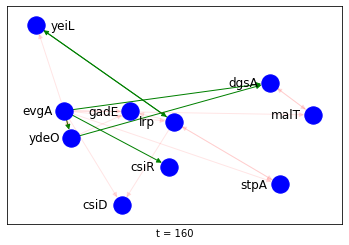

Time step: 160


<Figure size 432x288 with 0 Axes>

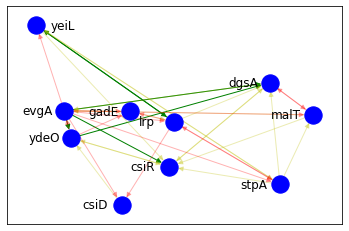

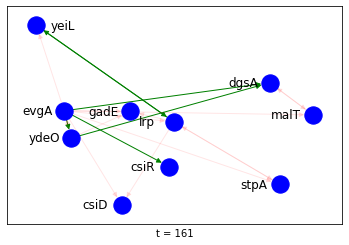

Time step: 161


<Figure size 432x288 with 0 Axes>

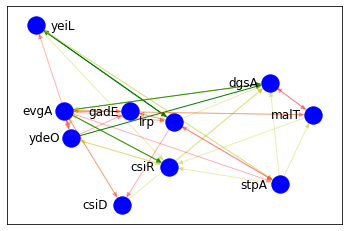

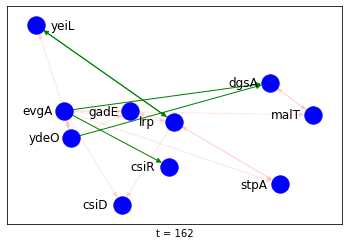

Time step: 162


<Figure size 432x288 with 0 Axes>

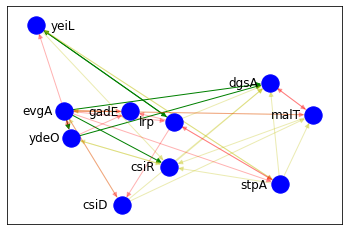

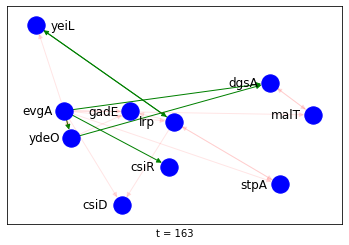

Time step: 163


<Figure size 432x288 with 0 Axes>

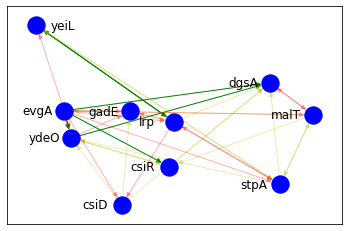

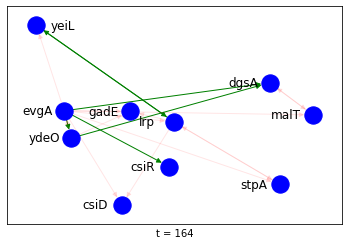

Time step: 164


<Figure size 432x288 with 0 Axes>

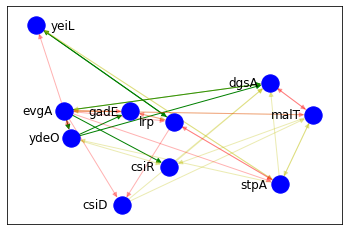

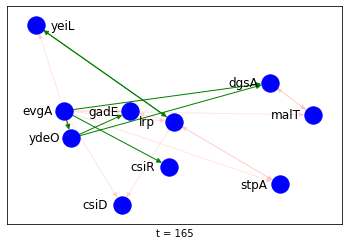

Time step: 165


<Figure size 432x288 with 0 Axes>

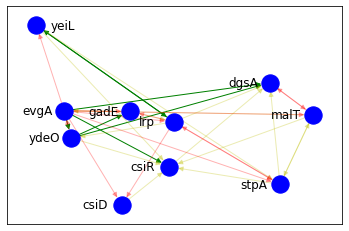

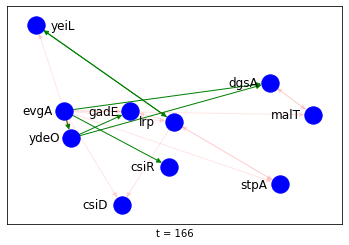

Time step: 166


<Figure size 432x288 with 0 Axes>

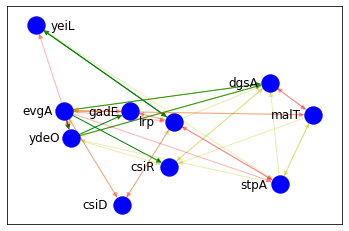

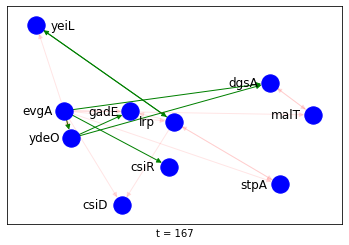

Time step: 167


<Figure size 432x288 with 0 Axes>

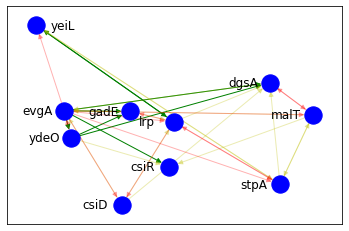

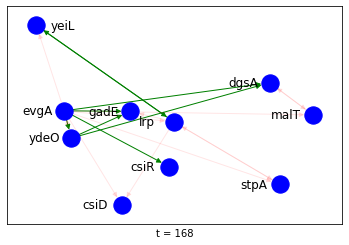

Time step: 168


<Figure size 432x288 with 0 Axes>

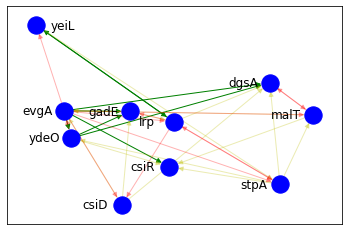

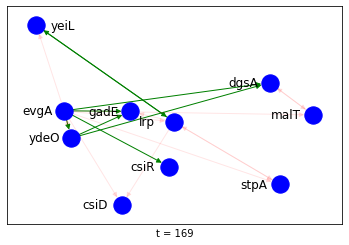

Time step: 169


<Figure size 432x288 with 0 Axes>

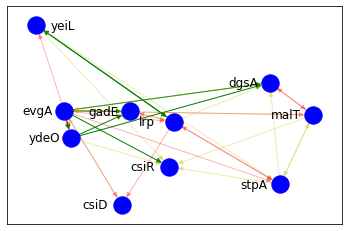

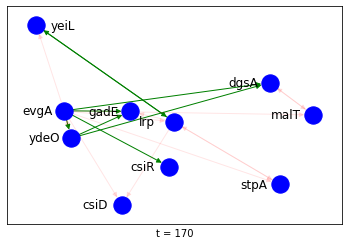

Time step: 170


<Figure size 432x288 with 0 Axes>

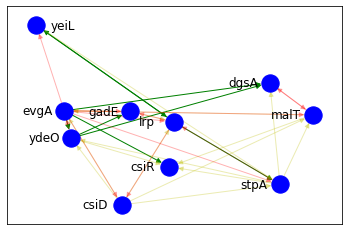

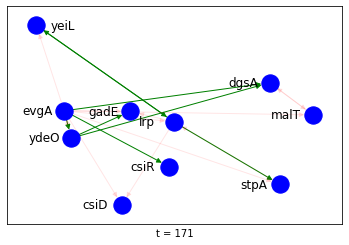

Time step: 171


<Figure size 432x288 with 0 Axes>

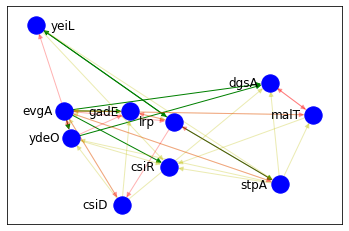

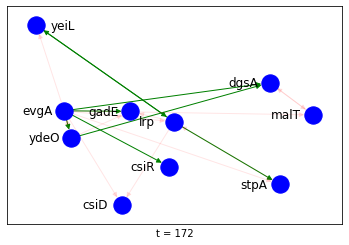

Time step: 172


<Figure size 432x288 with 0 Axes>

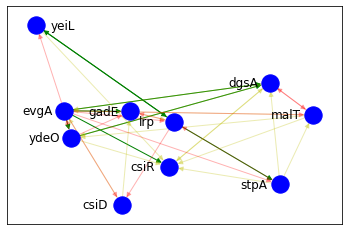

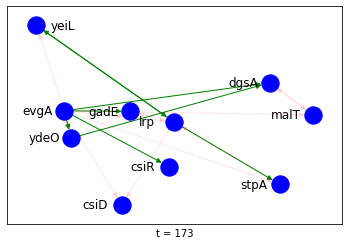

Time step: 173


<Figure size 432x288 with 0 Axes>

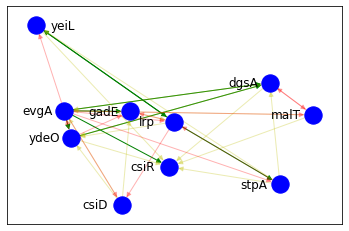

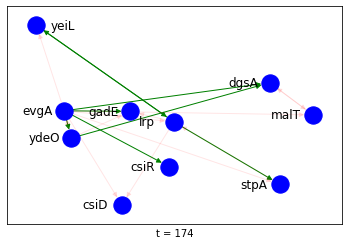

Time step: 174


<Figure size 432x288 with 0 Axes>

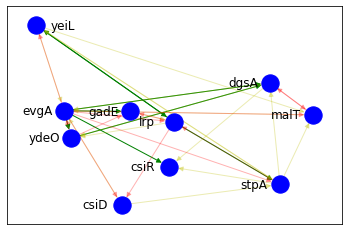

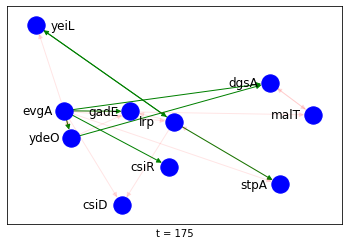

Time step: 175


<Figure size 432x288 with 0 Axes>

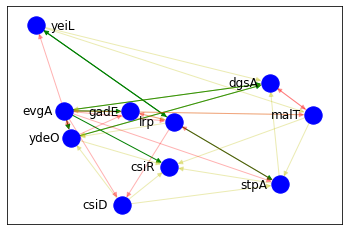

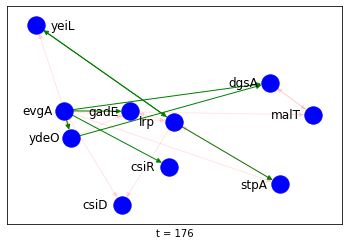

Time step: 176


<Figure size 432x288 with 0 Axes>

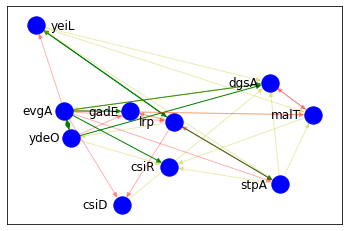

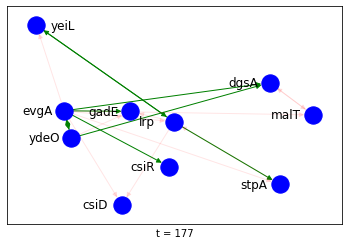

Time step: 177


<Figure size 432x288 with 0 Axes>

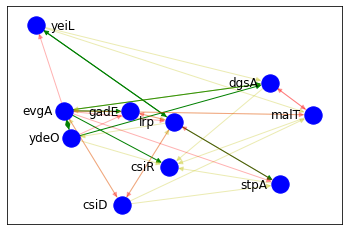

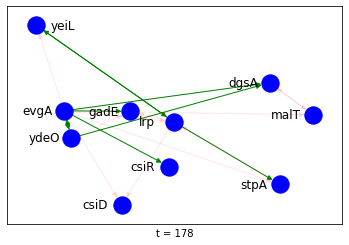

Time step: 178


<Figure size 432x288 with 0 Axes>

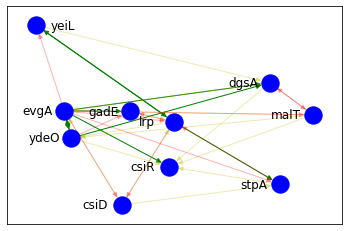

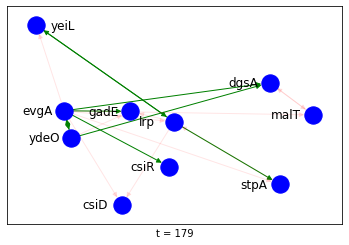

Time step: 179


<Figure size 432x288 with 0 Axes>

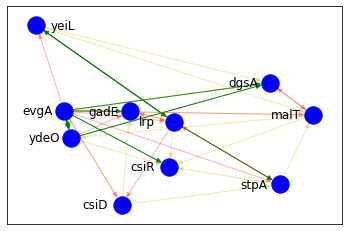

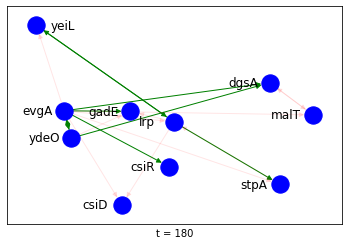

Time step: 180


<Figure size 432x288 with 0 Axes>

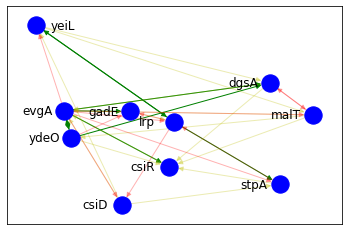

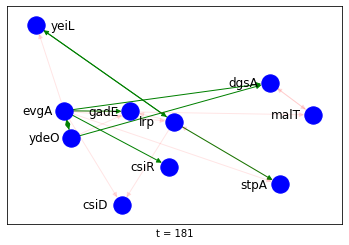

Time step: 181


<Figure size 432x288 with 0 Axes>

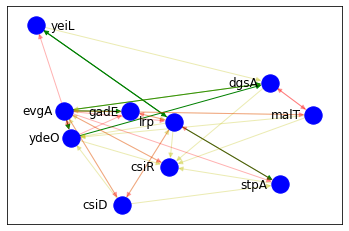

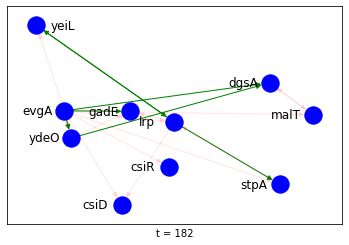

Time step: 182


<Figure size 432x288 with 0 Axes>

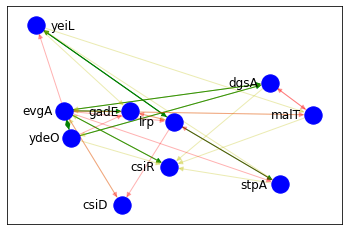

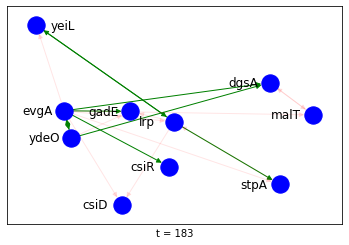

Time step: 183


<Figure size 432x288 with 0 Axes>

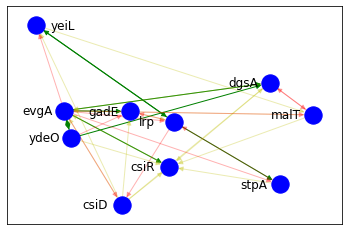

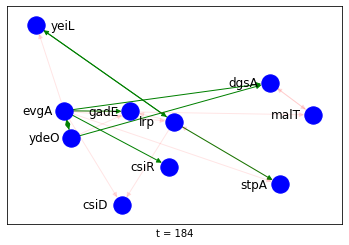

Time step: 184


<Figure size 432x288 with 0 Axes>

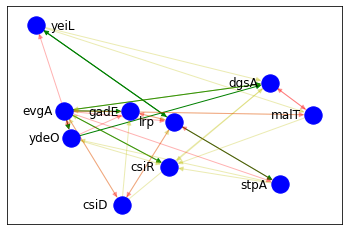

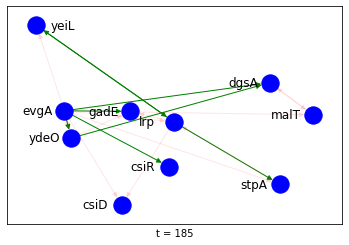

Time step: 185


<Figure size 432x288 with 0 Axes>

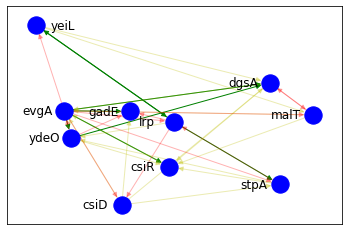

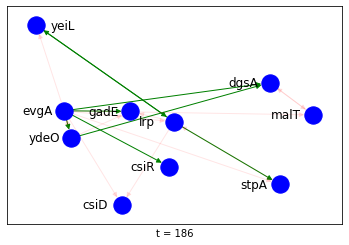

Time step: 186


<Figure size 432x288 with 0 Axes>

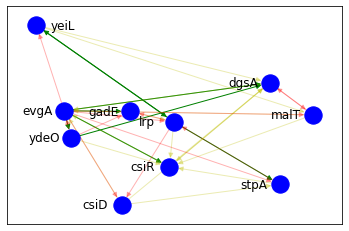

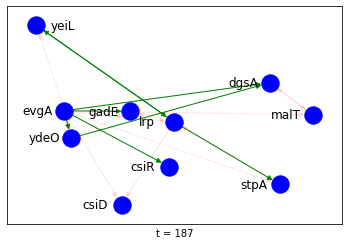

Time step: 187


<Figure size 432x288 with 0 Axes>

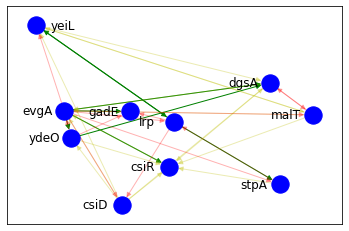

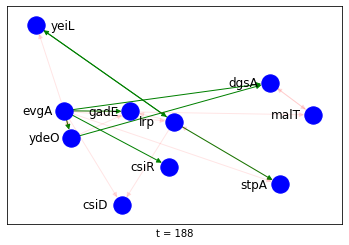

Time step: 188


<Figure size 432x288 with 0 Axes>

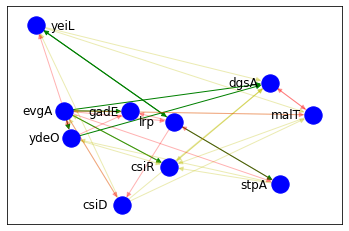

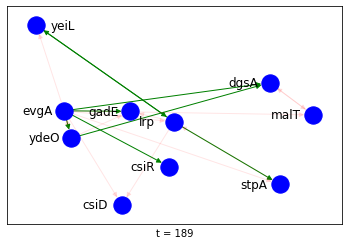

Time step: 189


<Figure size 432x288 with 0 Axes>

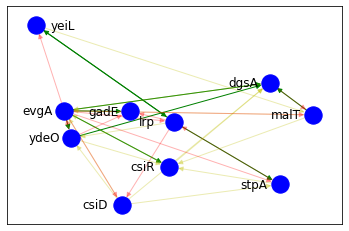

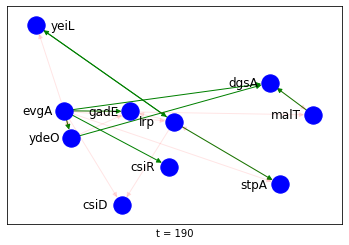

Time step: 190


<Figure size 432x288 with 0 Axes>

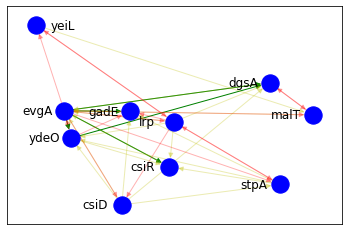

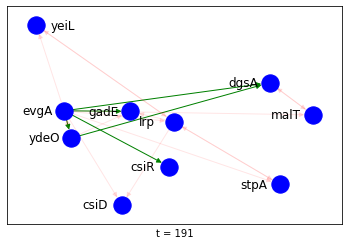

Time step: 191


<Figure size 432x288 with 0 Axes>

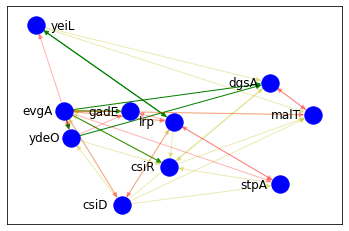

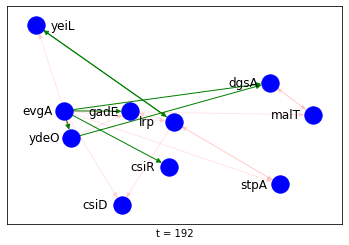

Time step: 192


<Figure size 432x288 with 0 Axes>

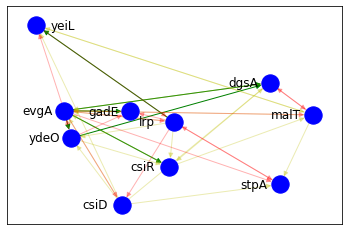

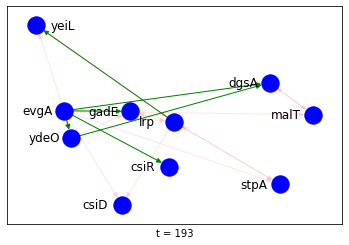

Time step: 193


<Figure size 432x288 with 0 Axes>

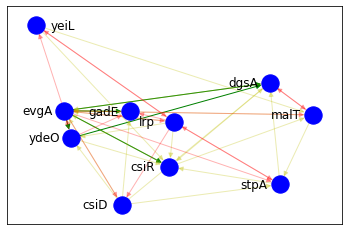

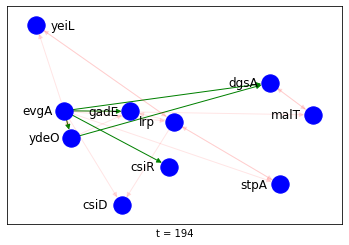

Time step: 194


<Figure size 432x288 with 0 Axes>

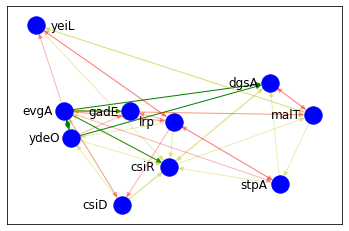

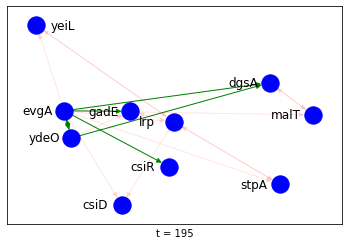

Time step: 195


<Figure size 432x288 with 0 Axes>

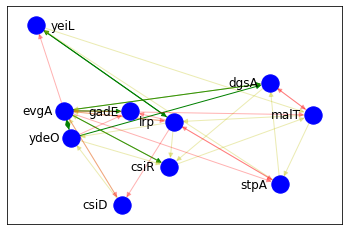

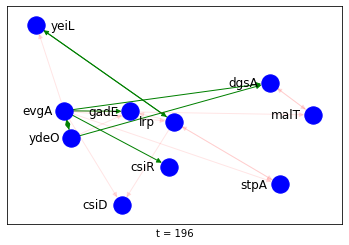

Time step: 196


<Figure size 432x288 with 0 Axes>

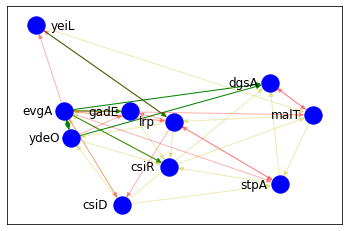

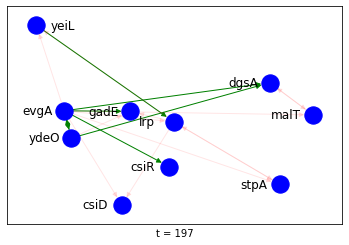

Time step: 197


<Figure size 432x288 with 0 Axes>

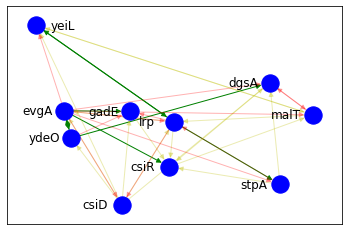

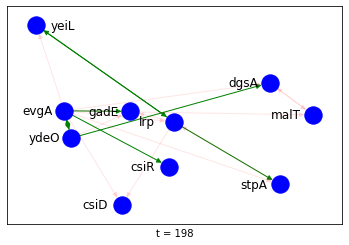

Time step: 198


<Figure size 432x288 with 0 Axes>

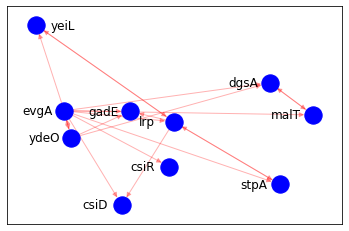

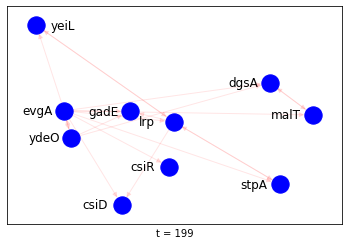

<Figure size 432x288 with 0 Axes>

In [23]:
tt = 199
top_e = 30/(nodes**2)

# os.mkdir(fig_path)
for t in range(tt):
    print('Time step: %d' % t)
    e = []
    th = get_thresh(nw[t], sparsity=top_e)
    for j in range(nodes):
        for i in ext_rel(nw[t,j], th):
            e.append((gene_name[i], gene_name[j]))
    #print(e)
    draw_graph(e, gtG=bG, npos=npos, lpos=lpos, save='%s%d' % (fig_path, t+1), t=t+1)

In [11]:
# make gif
from PIL import Image 

images=[]

for t in range(tt):
    im = Image.open('%s%d.png' % (fig_path, t+1)) 
    images.append(im)
    
images[0].save('%s/ani.gif' % fig_path,
               save_all=True, append_images=images[1:], optimize=False, duration=100, loop=1)

In [12]:
# Plot time series
raw_data = []
with open('/home/linaiqi/Lab/data/gene/ts10gene201.txt') as f:
    _ = f.readline().strip().split()[1:]
    for l in f:
        row = [float(x) for x in l.strip().split()]
        if len(row) > 0:
            raw_data.append(row[1:])
            
data = np.asarray(raw_data)[:201]

In [13]:
print(data.shape, pred.shape, var.shape)

(201, 10) (198, 10) (198, 10)


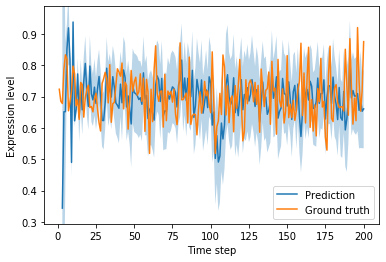

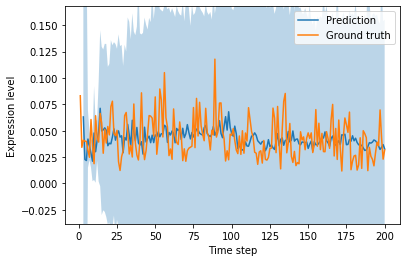

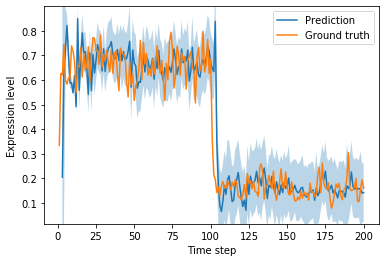

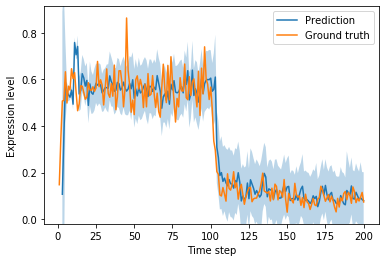

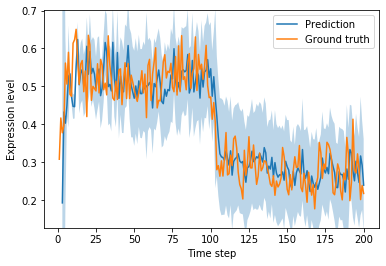

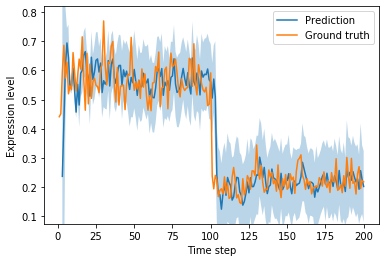

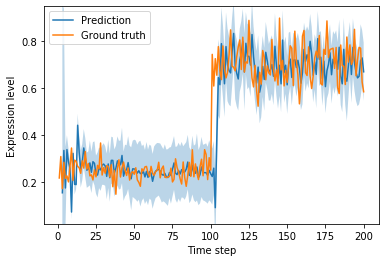

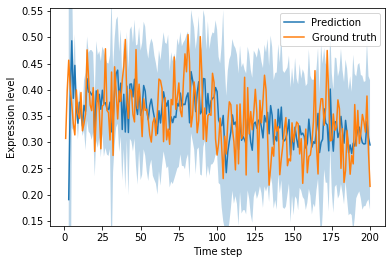

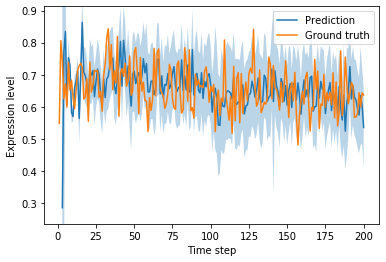

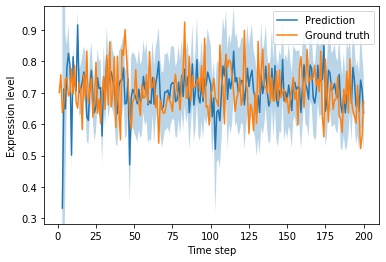

In [14]:
ks=2
yli=0.05

for j in range(10):
    plt.figure()
    ymax = max(max(data[1:, j]), max(pred[:, j]))
    ymin = min(min(data[1:, j]), min(pred[:, j]))
    plt.plot(range(3, 201), pred[:, j], label='Prediction')
    plt.plot(range(1, 201), data[1:, j], label='Ground truth')
    plt.fill_between(range(3, 201), pred[:, j]-ks*np.sqrt(var[:, j]), 
                     pred[:, j]+ks*np.sqrt(var[:, j]),
                     alpha=0.3)
    plt.ylim([ymin-yli, ymax+yli])
    plt.legend()
    plt.xlabel('Time step')
    plt.ylabel('Expression level')    
    plt.show()

In [15]:
# rmse over time

loss = (pred[:, :]-data[3:, :])**2

avg_loss = np.sqrt(np.mean(loss, axis=1))

In [16]:
avg_loss.shape

(198,)

Text(0, 0.5, 'RMSE')

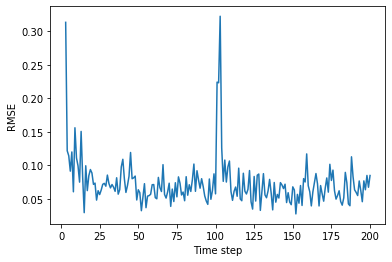

In [17]:
plt.figure()
plt.plot(range(3, 201), avg_loss, label='RMSE')
# plt.legend()
plt.xlabel('Time step')
plt.ylabel('RMSE')    

In [18]:
np.mean(avg_loss)

0.07333205902961375